In [1]:
from astropy.io import fits
import os
import shutil
from astropy.timeseries import LombScargle
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from scipy import optimize
from scipy.interpolate import CubicSpline
from scipy.integrate import simps
from scipy.interpolate import UnivariateSpline
from scipy.ndimage import gaussian_filter
import scipy.signal as signal
from astropy.time import Time
import pandas as pd
from lmfit import Model
from scipy.optimize import curve_fit
import matplotlib.colors as colors
import matplotlib.cbook as cbook
from scipy.ndimage.filters import uniform_filter
from matplotlib.ticker import (MultipleLocator, FormatStrFormatter,
                               AutoMinorLocator)

from sklearn.metrics import mean_squared_error
from PyAstronomy import pyasl

In [11]:
countGlob = 1
path = 'C:/Users/Admin/GD1400/oct29/'
with open(path+'Files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1



timesMid = []
path = 'C:/Users/Admin/GD1400/oct29/'
with open(path+'Files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        time = hdul[0].header['JD']
        timesMid.append(time)
        hdul.close()

In [12]:
timesMid

[2455499.52138634,
 2455499.52842986,
 2455499.54971991,
 2455499.56807662,
 2455499.57512014,
 2455499.59640729,
 2455499.63737106,
 2455499.64441459,
 2455499.69021469,
 2455499.69725822,
 2455499.71853751,
 2455499.73686181,
 2455499.74390532,
 2455499.76522824,
 2455499.79537973,
 2455499.80242327,
 2455499.82371065,
 2455499.84218463,
 2455499.51426134,
 2455499.53555139,
 2455499.54259491,
 2455499.56097836,
 2455499.5822441,
 2455499.58928762,
 2455499.63023959,
 2455499.65152442,
 2455499.68309386,
 2455499.70437314,
 2455499.71141666,
 2455499.72973657,
 2455499.75102893,
 2455499.75807247,
 2455499.78824571,
 2455499.80954733,
 2455499.81659096,
 2455499.83506286]

In [14]:
plt.plot()

36

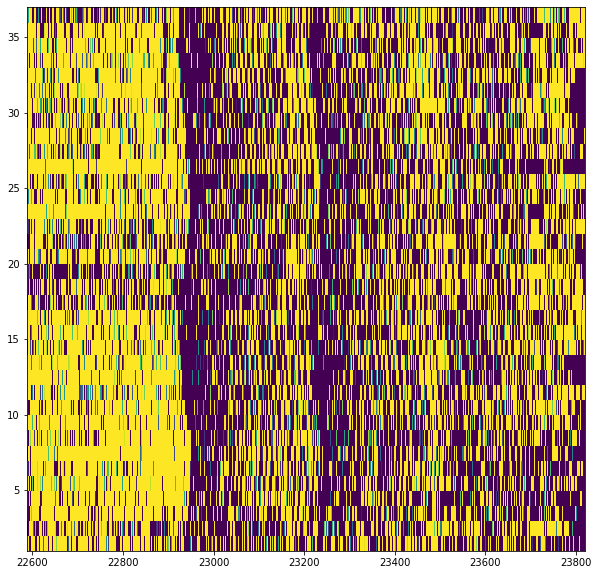

In [15]:
X,Y = np.meshgrid(holder_arrayWav[0], np.linspace(1,37,37))

plt.figure(figsize=(10,10))
plt.pcolormesh(X,Y,holder_arrayFlux,vmin=0.975, vmax=1.0)


In [23]:
levels = np.linspace(0.975,1,10)
levels[0] = 0
levels[-1]=10

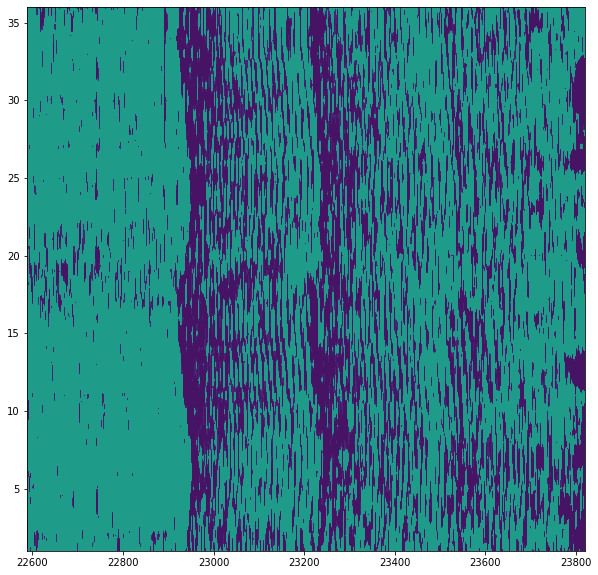

In [24]:

X,Y = np.meshgrid(holder_arrayWav[0], np.linspace(1,36,36))

plt.figure(figsize=(10,10))
plt.contourf(X,Y,holder_arrayFlux,levels=levels)


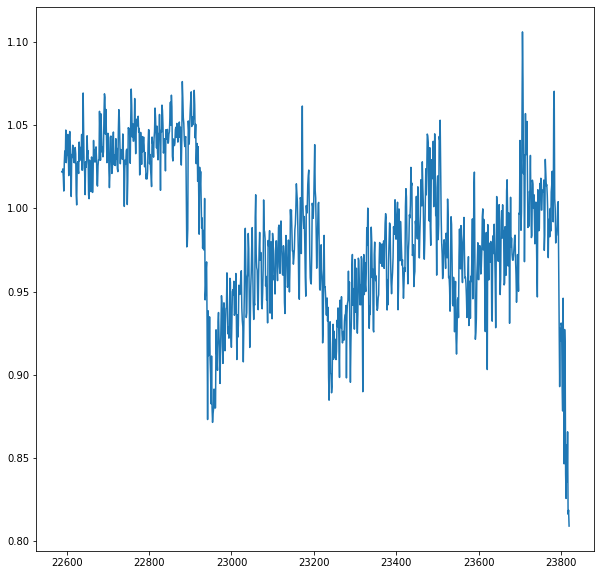

In [29]:
plt.figure(figsize=(10,10))
plt.plot(holder_arrayWav[0],holder_arrayFlux.sum(axis=0)/36)

In [3]:
countGlob = 1
path = 'C:/Users/Admin/forPython/'
with open(path+'toAnalyse') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1

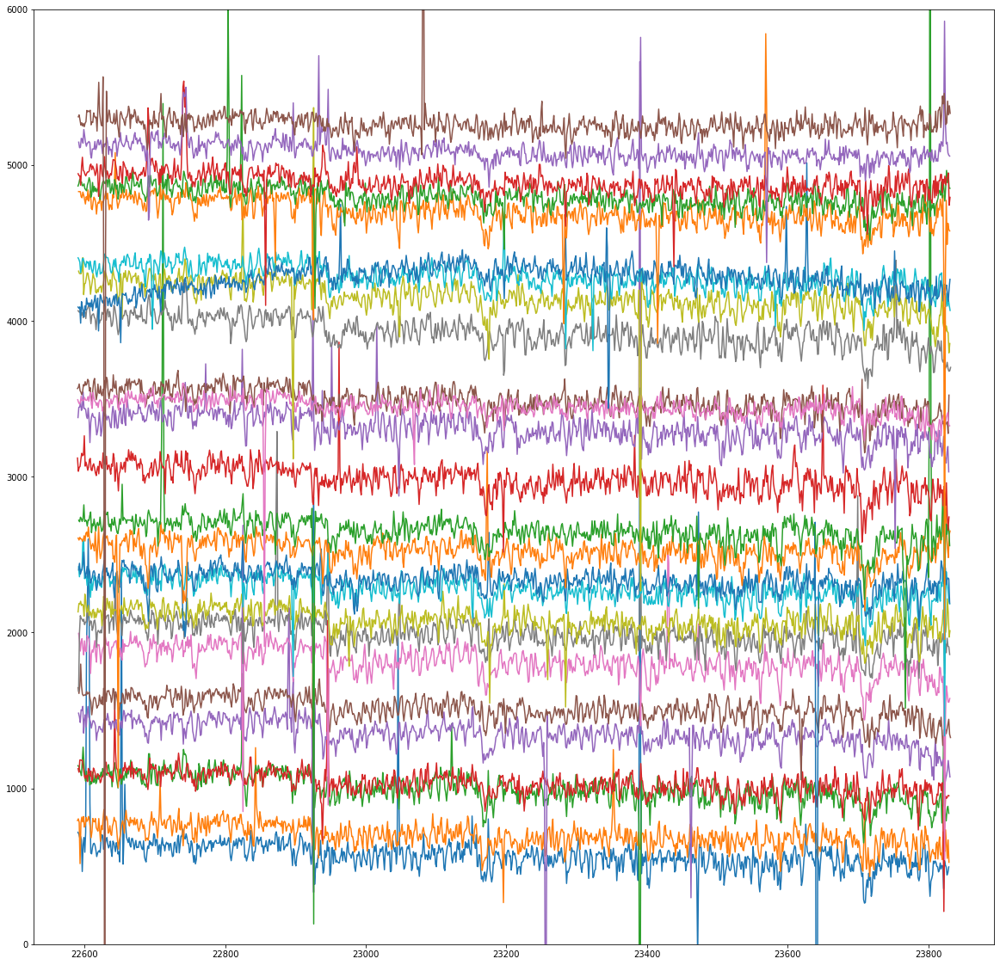

In [4]:
plt.figure(figsize=(20,20))
plt.ylim(0,6000)
for i in range(26):
    plt.plot(holder_arrayWav[i],holder_arrayFlux[i]+i*200)
plt.savefig('specs.pdf')

In [11]:

wvl, flx = pyasl.read1dFitsSpec("forPython/AB1.3Frame.ms.fits")

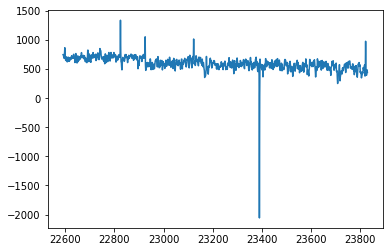

In [12]:
plt.plot(wvl,flx)

In [3]:
countGlob = 1
path = 'C:/Users/Admin/forPython/oct29/'
with open(path+'toAnalyse') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1

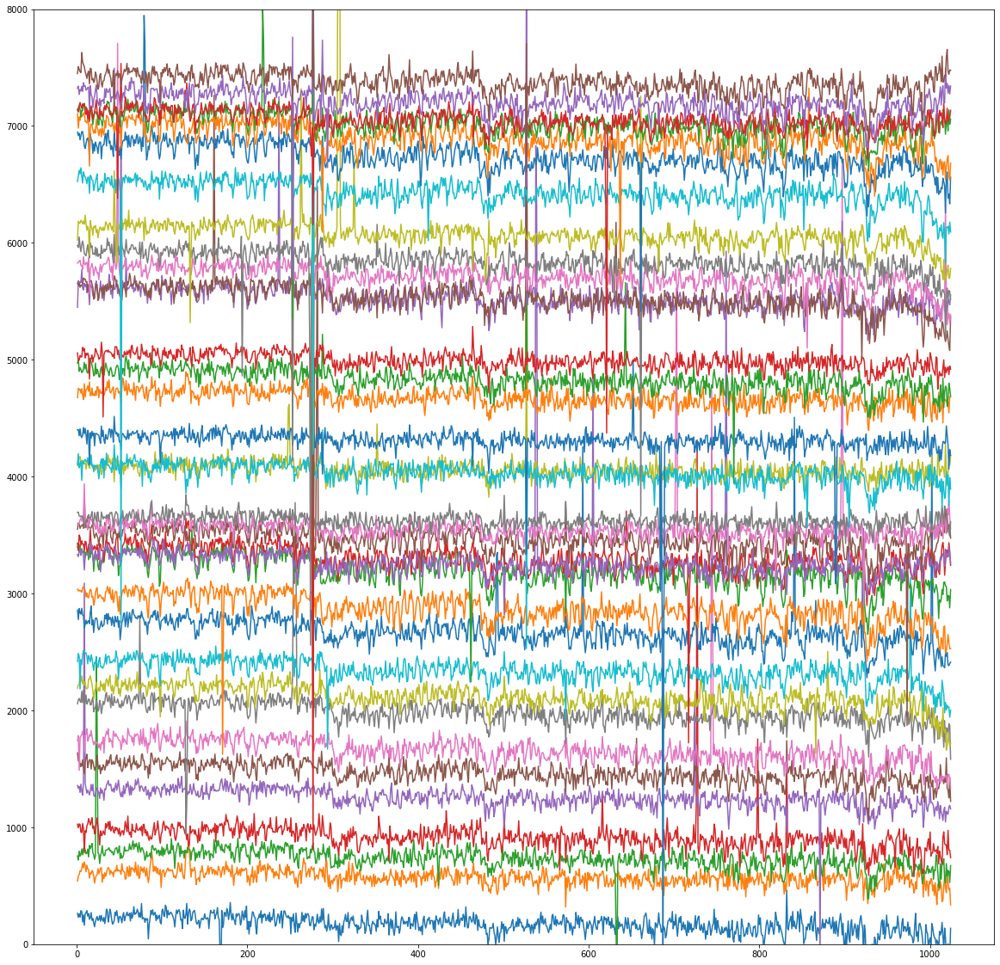

In [6]:
plt.figure(figsize=(20,20))
plt.ylim(0,8000)
for i in range(36):
    plt.plot(holder_arrayWav[i],holder_arrayFlux[i]+i*200)
    

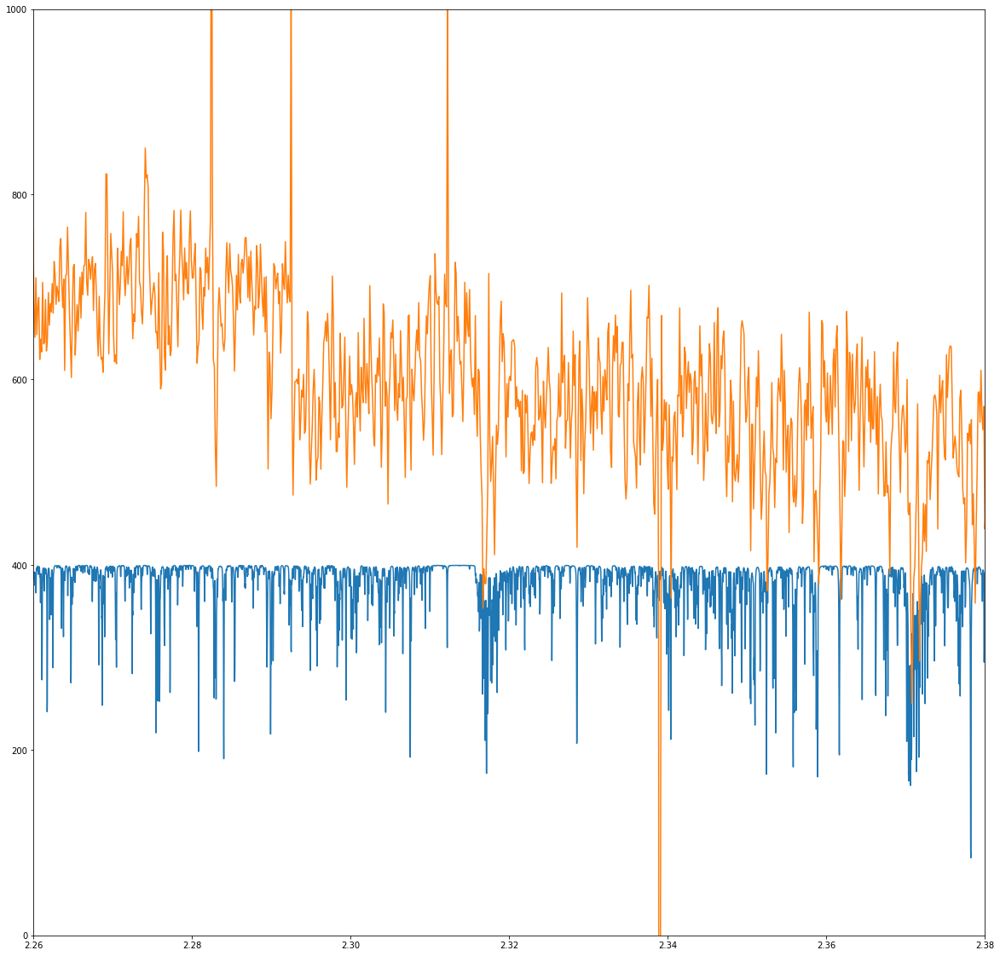

In [18]:
plt.figure(figsize=(20,20))
plt.ylim(0,1000)
indata = np.loadtxt("mktrans_zm_10_10.dat", usecols=(0,1))
wavelength = indata[:,0]
intensity = indata[:,1]
plt.plot(wavelength, intensity*400)
plt.plot(holder_arrayWav[2]/10000,holder_arrayFlux[2])
plt.xlim(2.26,2.38)
plt.savefig('AtosphericTransmission.pdf')

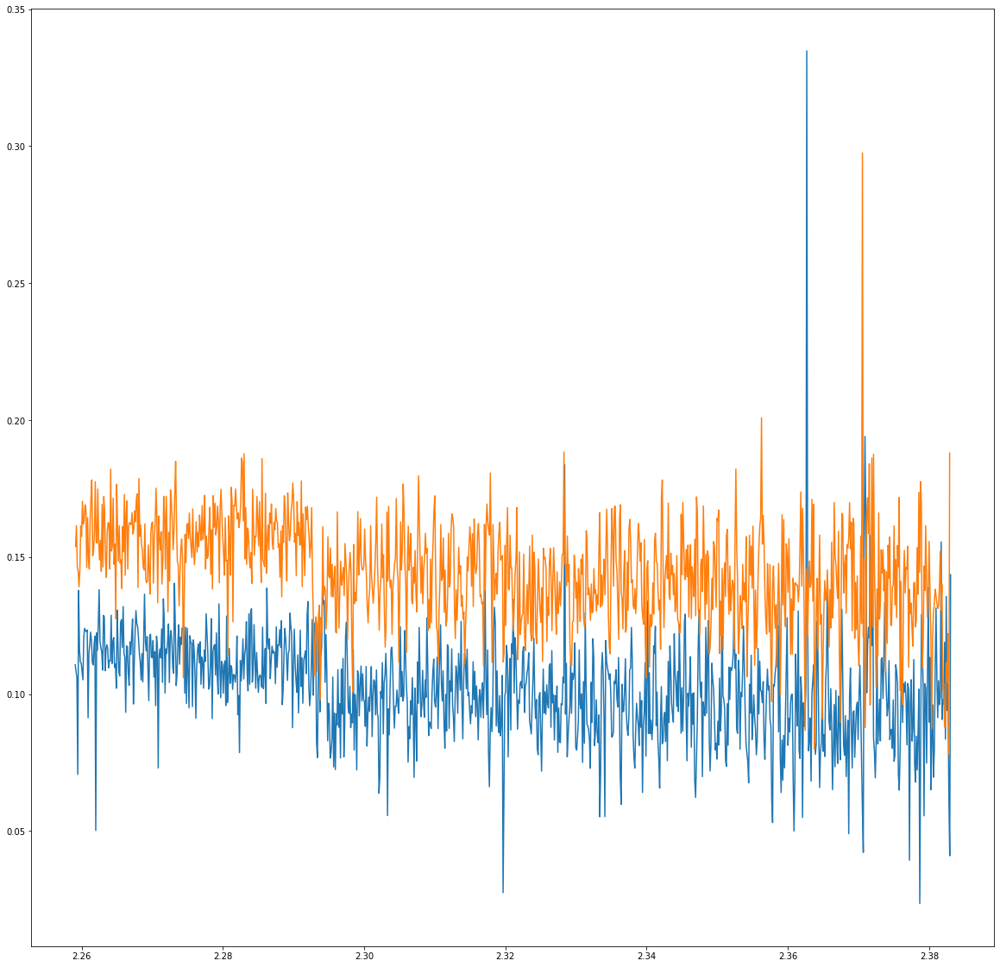

In [3]:
plt.figure(figsize=(20,20))
indata = np.loadtxt("GD1400/test2.dat", usecols=(0,1))
wavelength = indata[:,0]
intensity = indata[:,1]
plt.plot(wavelength, intensity)

indata = np.loadtxt("GD1400/Bettertest10.dat", usecols=(0,1))
wavelength = indata[:,0]
intensity = indata[:,1]
plt.plot(wavelength, intensity)

In [2]:
countGlob = 1
path = 'C:/Users/Admin/GD1400/oct28/'
with open(path+'files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1



timesMid = []
path = 'C:/Users/Admin/GD1400/oct28/'
with open(path+'files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        time = hdul[0].header['JD']
        timesMid.append(time)
        hdul.close()
        
oct28F = holder_arrayFlux
oct28W = holder_arrayWav
oct28T = timesMid

In [3]:
countGlob = 1
path = 'C:/Users/Admin/GD1400/oct29/'
with open(path+'Files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1



timesMid = []
path = 'C:/Users/Admin/GD1400/oct29/'
with open(path+'Files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        time = hdul[0].header['JD']
        timesMid.append(time)
        hdul.close()
        
oct29F = holder_arrayFlux
oct29W = holder_arrayWav
oct29T = timesMid

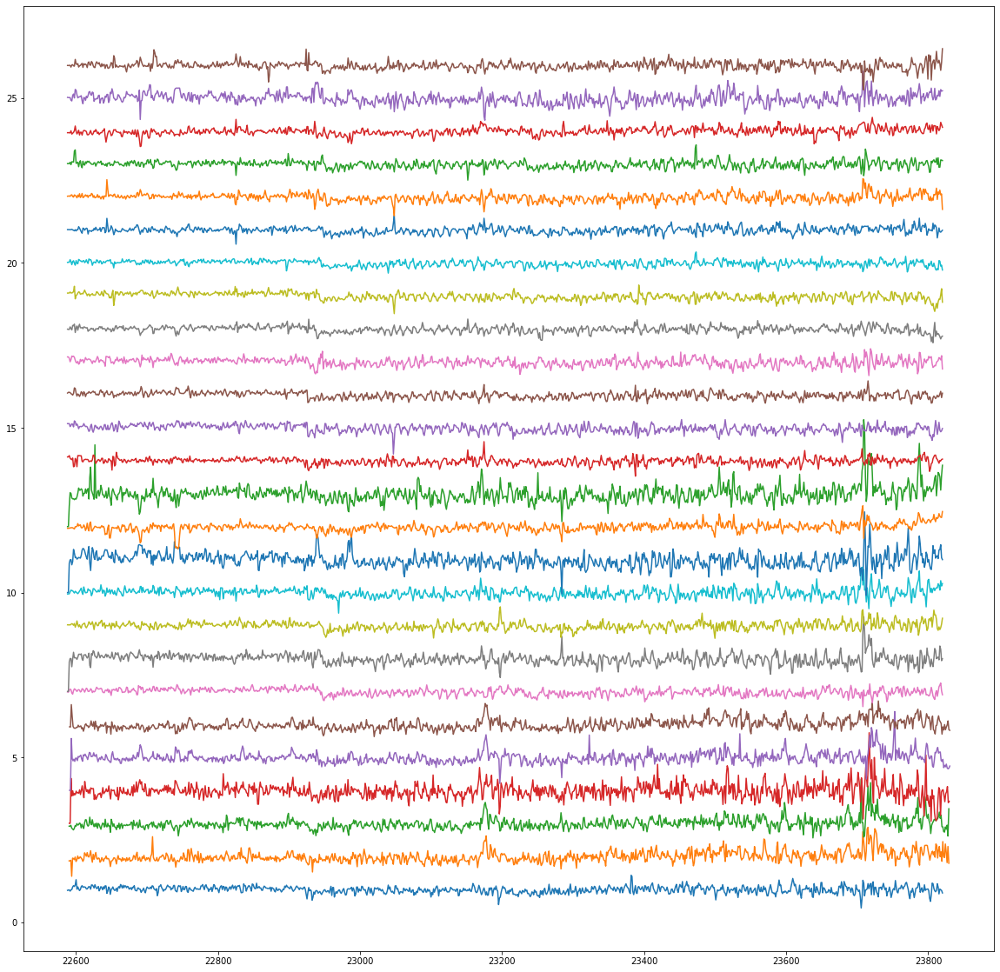

In [7]:
plt.figure(figsize=(20,20))
#plt.ylim(0,1)
for i in range(26):
    plt.plot(oct28W[i],oct28F[i]+i*1)
    

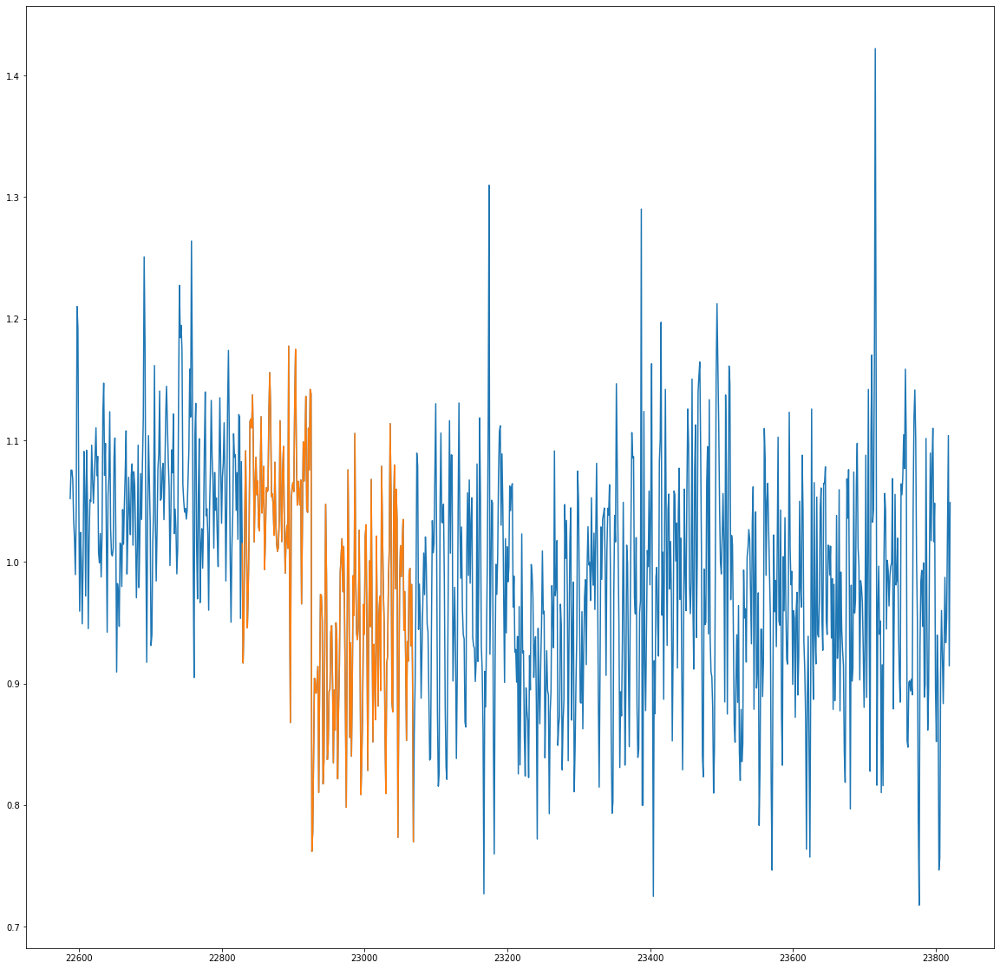

In [13]:
plt.figure(figsize=(20,20))
plt.plot(oct28W[15],oct28F[15])
plt.plot(oct28W[15][200:400],oct28F[15][200:400])

In [60]:
from sklearn.metrics import mean_squared_error
def detShift(specArray, template):
    errorsArrGlobal = []
    count = 0
    for spec in specArray:
        errorsArrAvg = np.zeros(100)
        for x in range(100):
            select = np.random.choice(1024, 100)
            spec[select] = np.mean(spec)
            errorsArr = []
            for i in range(100):
                error = mean_squared_error(spec[150+i:350+i], template[200:400])
                errorsArr.append(error)
            errorsArrAvg = errorsArrAvg+errorsArr 
        if count == 0:
            errorsArrAvg = np.argsort(errorsArrAvg)
            errorsArrGlobal = errorsArrAvg
            count = 1
        else:
            errorsArrAvg = np.argsort(errorsArrAvg)
            errorsArrGlobal = np.vstack((errorsArrGlobal, errorsArrAvg))
    return errorsArrGlobal

In [61]:
errors = detShift(oct28F,oct28F[15])
len(errors)

26

In [58]:
errors

array([[0.85871203, 0.8507261 , 0.85308508, ..., 0.88590875, 0.8919905 ,
        0.91119741],
       [0.96189091, 0.95891371, 1.03208885, ..., 1.0174103 , 1.02223225,
        1.07024718],
       [0.93107387, 0.92059868, 0.92352983, ..., 1.01986431, 1.02022421,
        0.98117285],
       ...,
       [0.09178582, 0.09172648, 0.09178907, ..., 0.09623882, 0.09625543,
        0.09636343],
       [0.21469261, 0.21494579, 0.21690934, ..., 0.2544058 , 0.26309853,
        0.25509144],
       [0.10044029, 0.10036353, 0.10030437, ..., 0.09620532, 0.09688955,
        0.09665055]])

In [55]:
test = np.linspace(0,19,20)
inde = [1,2,5]
test[inde] = 0
test

array([ 0.,  0.,  0.,  3.,  4.,  0.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19.])

In [51]:
np.sort(np.random.choice(201, 170))
#testArr = np.linspace(0,999,1000)
#testArr[np.random.choice(201, 170)]

array([  0,   1,   1,   2,   2,   3,   4,   6,   8,   8,   9,  10,  11,
        12,  14,  14,  20,  20,  20,  21,  25,  26,  27,  28,  29,  30,
        32,  35,  38,  39,  40,  41,  44,  44,  48,  48,  53,  53,  54,
        57,  57,  59,  63,  64,  65,  66,  68,  70,  71,  71,  72,  73,
        73,  75,  76,  76,  76,  79,  79,  80,  82,  82,  82,  83,  87,
        87,  87,  87,  89,  91,  92,  93,  96,  96,  97,  98,  99, 100,
       112, 114, 114, 114, 118, 118, 119, 119, 119, 121, 123, 125, 127,
       132, 132, 133, 133, 133, 135, 136, 136, 137, 137, 139, 139, 142,
       144, 144, 144, 144, 145, 145, 147, 148, 149, 151, 152, 153, 154,
       154, 155, 155, 157, 158, 159, 160, 161, 161, 161, 163, 163, 163,
       163, 167, 168, 168, 168, 168, 169, 169, 172, 173, 173, 174, 175,
       176, 176, 178, 178, 181, 183, 183, 185, 185, 185, 185, 186, 187,
       188, 191, 192, 193, 193, 193, 193, 193, 194, 195, 196, 197, 199,
       200])

In [42]:
errors.min()

0

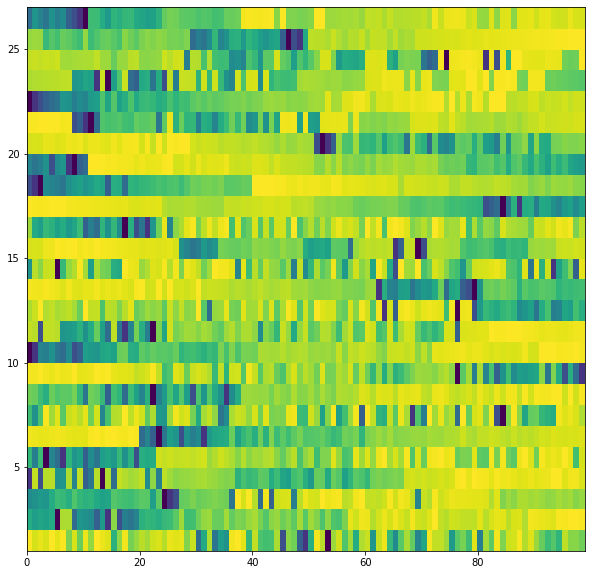

In [63]:
X,Y = np.meshgrid(np.linspace(0,99,100), np.linspace(1,27,27))
errors = errors+1
plt.figure(figsize=(10,10))
plt.pcolormesh(X,Y,errors,norm=colors.LogNorm(vmin=errors.min(), vmax=errors.max()))

plt.show()

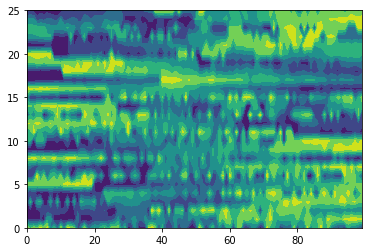

In [62]:
plt.contourf(errors)

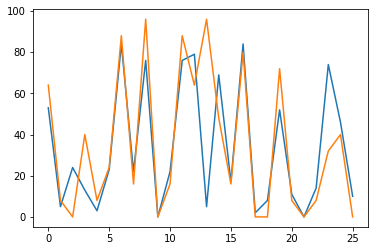

In [74]:
rowMax = []
rowMaxS = []
for line in errors:
    valMax = np.argmin(line)
    rowMax.append(valMax)
    line = np.nanmean(np.pad(line.astype(float), (0, 8 - line.size%8), mode='constant', constant_values=np.NaN).reshape(-1, 8), axis=1)
    valMax = np.argmin(line)
    
    rowMaxS.append(valMax)
    
plt.plot(rowMax)
plt.plot(np.array(rowMaxS)*8)

In [13]:
countGlob = 1
path = 'C:/Users/Admin/GD1400/oct28/'
with open(path+'files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1



timesMid = []
path = 'C:/Users/Admin/GD1400/oct28/'
with open(path+'files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        hdul = fits.open(filepath)
        time = hdul[0].header['JD']
        timesMid.append(time)
        hdul.close()
        
oct28F = holder_arrayFlux
oct28W = holder_arrayWav
oct28T = timesMid

In [17]:
countGlob = 1
path = 'C:/Users/Admin/GD1400/oct28/cor/'
with open(path+'files.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        print(filepath)

        indata = np.loadtxt(filepath, usecols=(0,1))
        wavelength = indata[:,0]
        intensity = indata[:,1]
        if countGlob == 1:
            holder_arrayFlux = intensity
            holder_arrayWav = wavelength
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, intensity))
            holder_arrayWav = np.vstack((holder_arrayWav, wavelength))
        countGlob = 2
        
oct28JF = holder_arrayFlux
oct28JW = holder_arrayWav

C:/Users/Admin/GD1400/oct28/cor/AB1.1.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB1.2.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB1.3.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB1.4.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB2.1.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB2.2.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB2.3.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB3.1.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB3.2.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB3.3.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB4.1.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB4.2.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/AB4.3.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA1.1.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA1.2.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA1.3.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA1.4.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA2.1.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA2.2.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA2.3.Corr.dat
C:/Users/Admin/GD1400/oct28/cor/BA3.1.Corr.dat
C:/Users/Admi

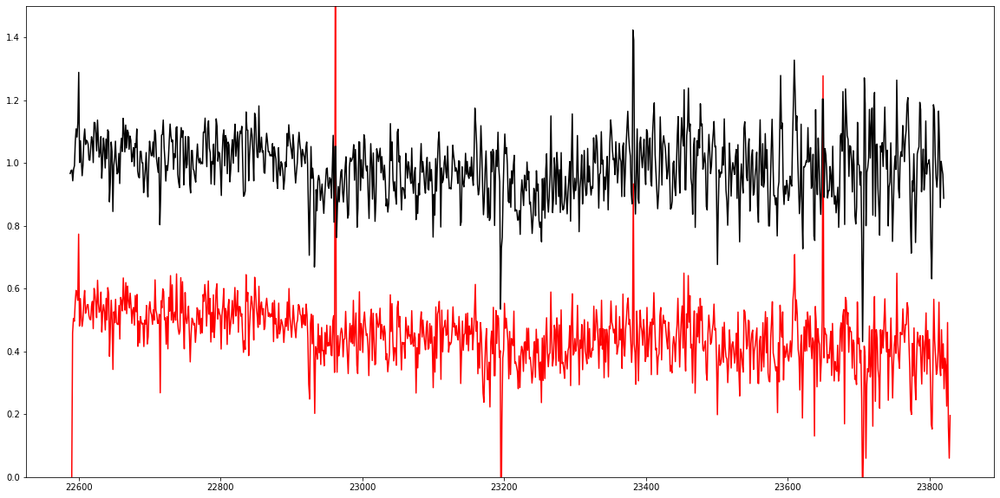

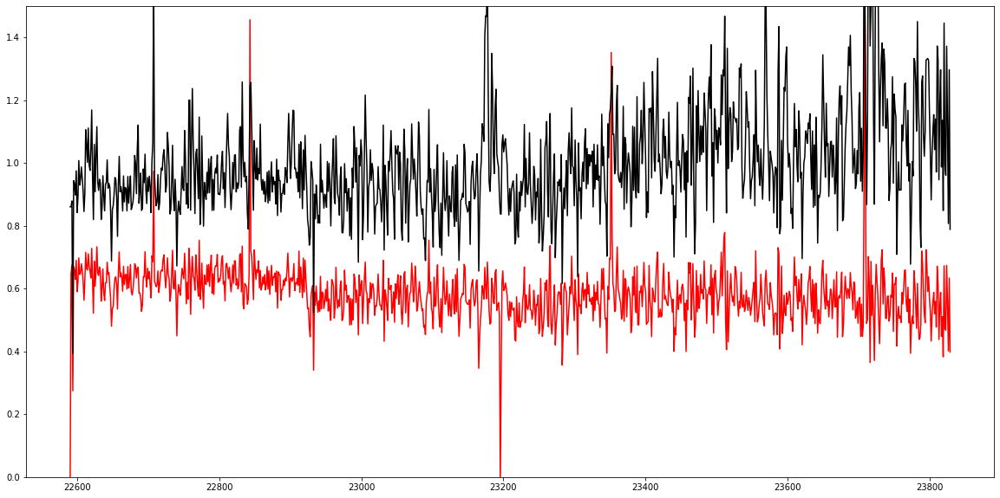

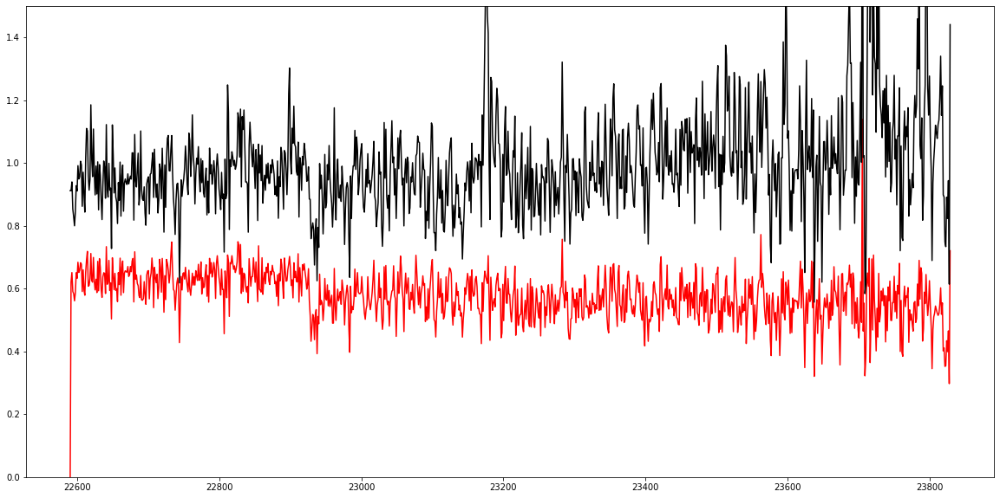

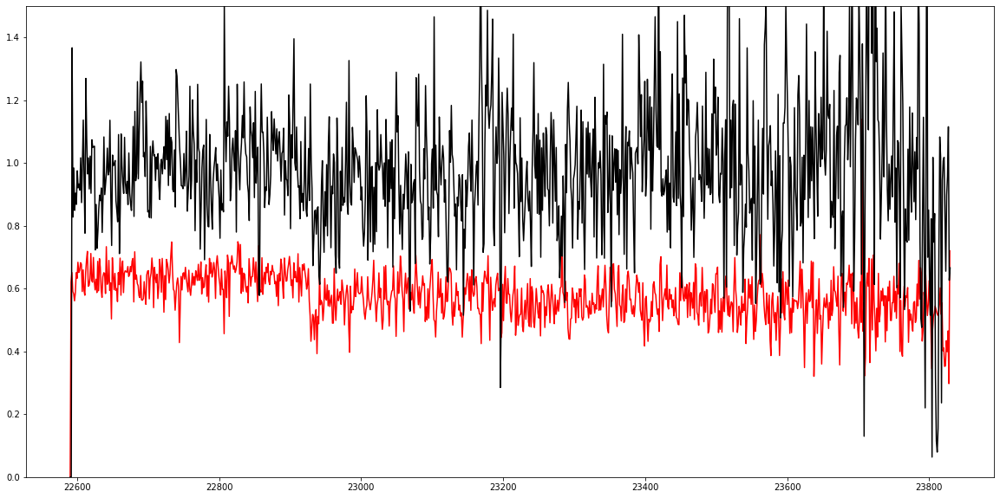

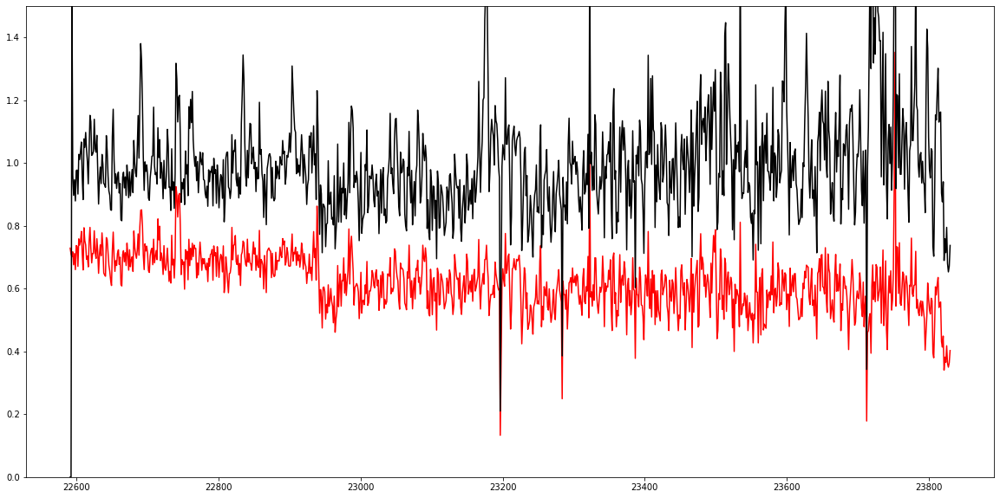

...

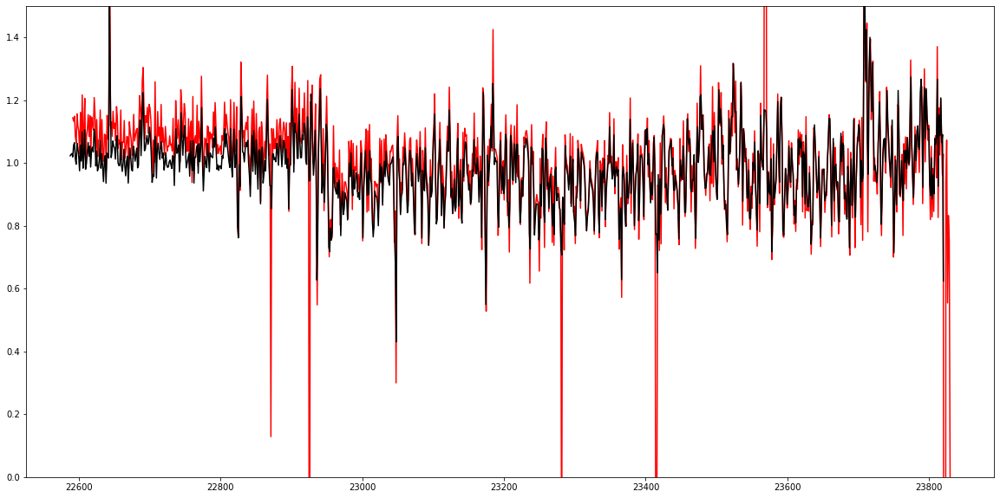

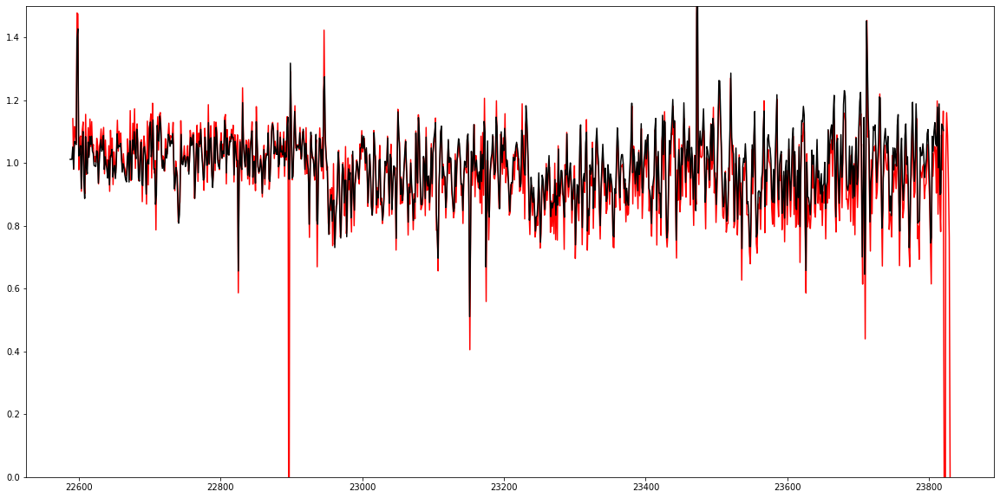

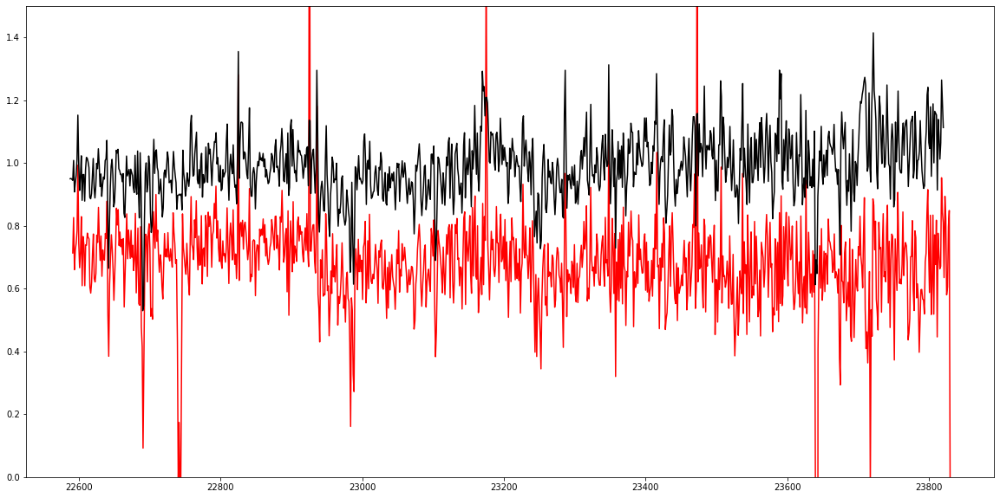

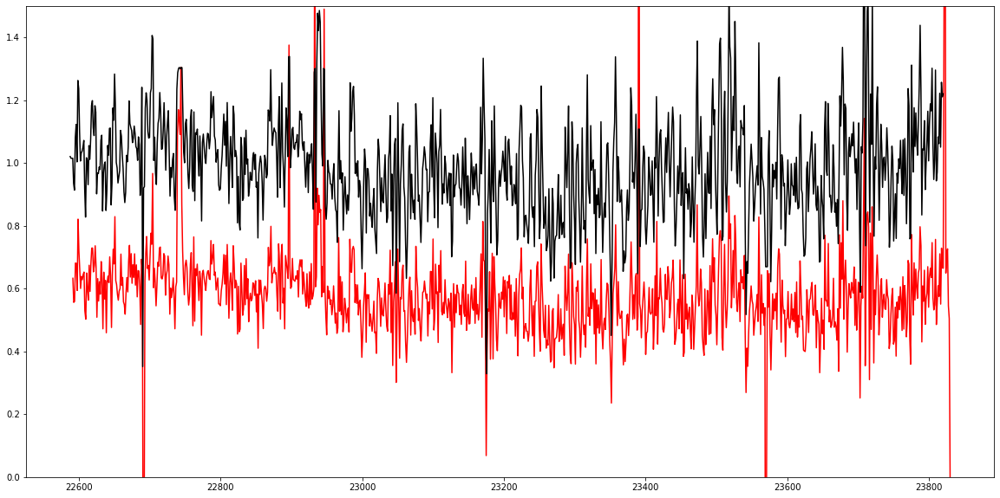

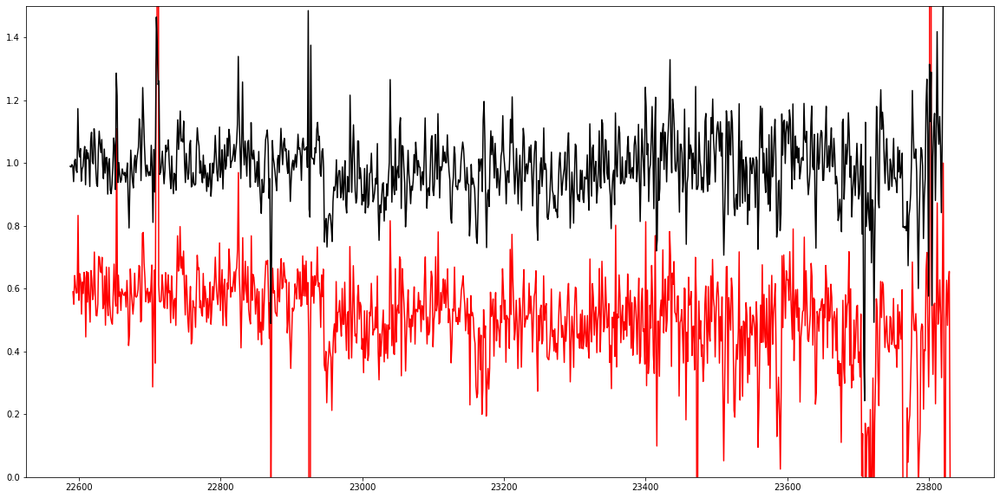

In [22]:
for i in range(26):
    plt.figure(figsize=(20,10))
    plt.plot(10000*oct28JW[i], 5*oct28JF[i], c='r')
    plt.plot(oct28W[i], oct28F[i], c='k')
    plt.ylim(0,1.5)
    plt.show()
    

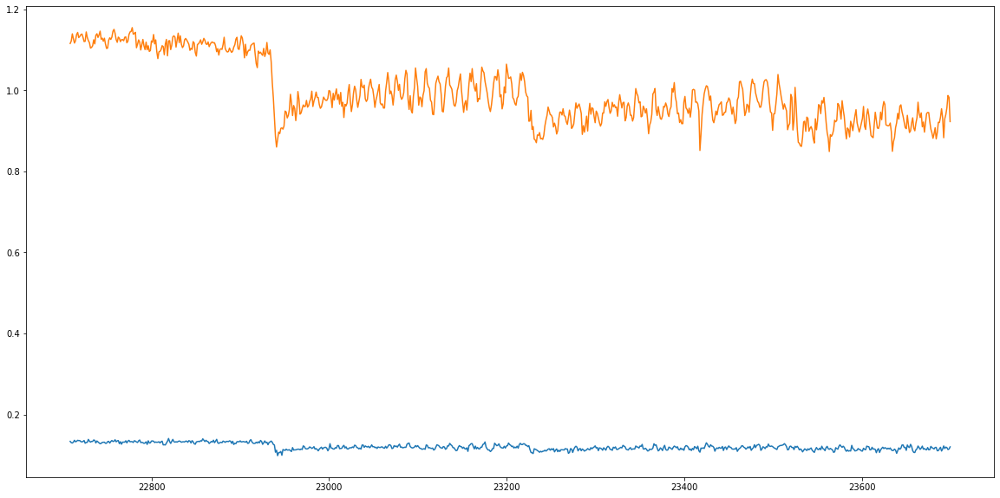

In [10]:
plt.figure(figsize=(20,10))
path = 'C:/Users/Admin/GD1400/shifted/28/Combined1.fits'
wvlTemp28, flxTemp28 = pyasl.read1dFitsSpec(path)
plt.plot(wvlTemp28[100:-100],flxTemp28[100:-100])

path = 'C:/Users/Admin/GD1400/shifted/29/Combined2.fits'
wvlTemp29, flxTemp29 = pyasl.read1dFitsSpec(path)
plt.plot(wvlTemp29[100:-100],flxTemp29[100:-100])

In [2]:
countGlob = 1
path = 'C:/Users/Admin/GD1400/shifted/28/'
with open(path+'Dised.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1
        
oct28F = holder_arrayFlux
oct28W = holder_arrayWav

In [3]:
countGlob = 1
path = 'C:/Users/Admin/GD1400/shifted/29/'
with open(path+'Dised.txt') as file:
    for line in file:
        line = line.strip('\n')
        filepath = path + line
        wvl, flx = pyasl.read1dFitsSpec(filepath)
        if countGlob == 1:
            holder_arrayFlux = flx
            holder_arrayWav = wvl
        else:
            holder_arrayFlux = np.vstack((holder_arrayFlux, flx))
            holder_arrayWav = np.vstack((holder_arrayWav, wvl))
        countGlob = 2
countGlob = 1
        
oct29F = holder_arrayFlux
oct29W = holder_arrayWav

In [11]:
from sklearn.metrics import mean_squared_error
def detShift(specArray, template):
    template = template/np.median(template)
    count = 0
    errorsArrGlobal = []
    for spec in specArray:
        errorsArr = []
        spec = spec/np.median(spec)
        for i in range(100):
            error = mean_squared_error(spec[150+i:350+i], template[200:400])
            errorsArr.append(error)
        errorsArr = errorsArr/np.mean(errorsArr)
        if count == 0:
            errorsArrGlobal = errorsArr
        else:
            errorsArrGlobal = np.vstack((errorsArrGlobal, errorsArr))
        count += 1
    return errorsArrGlobal

In [40]:
errors = detShift(oct29F, flxTemp)

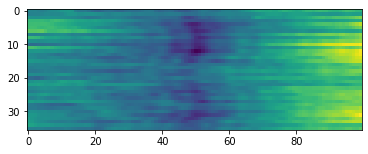

In [41]:
plt.imshow(errors)

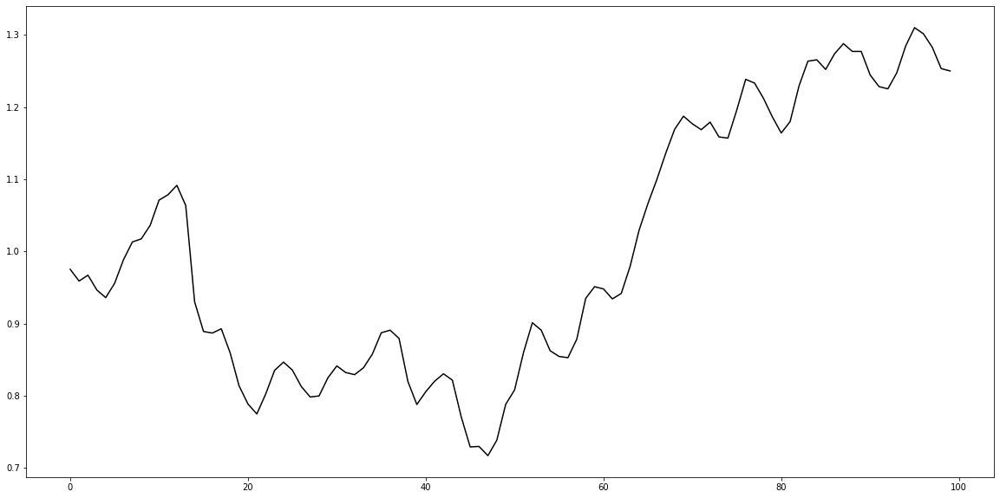

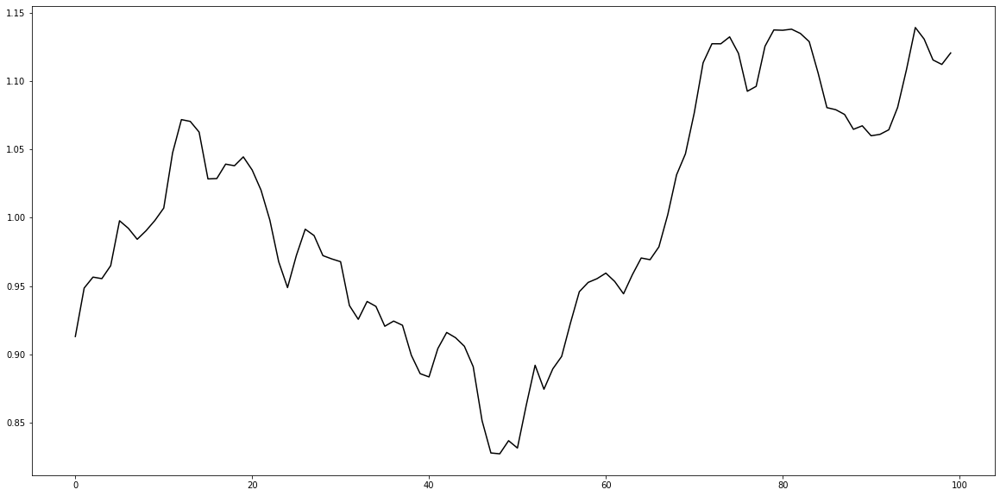

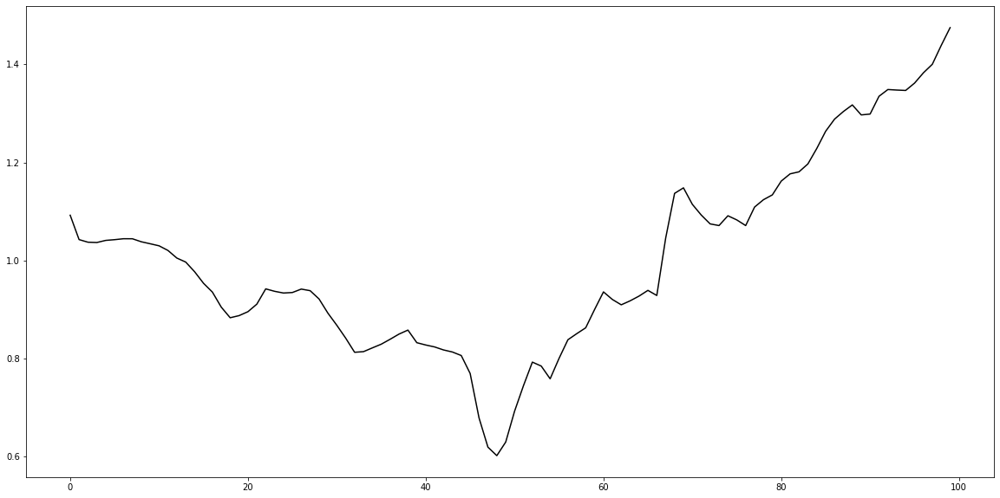

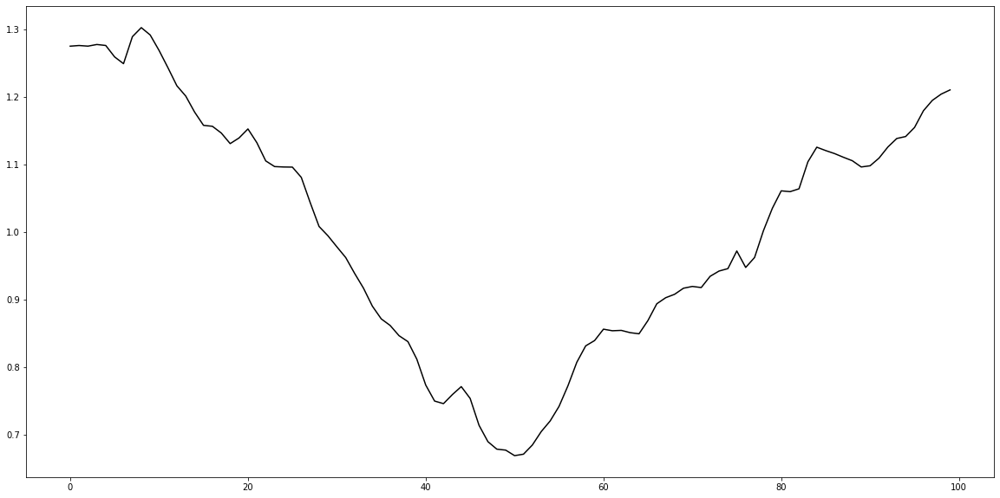

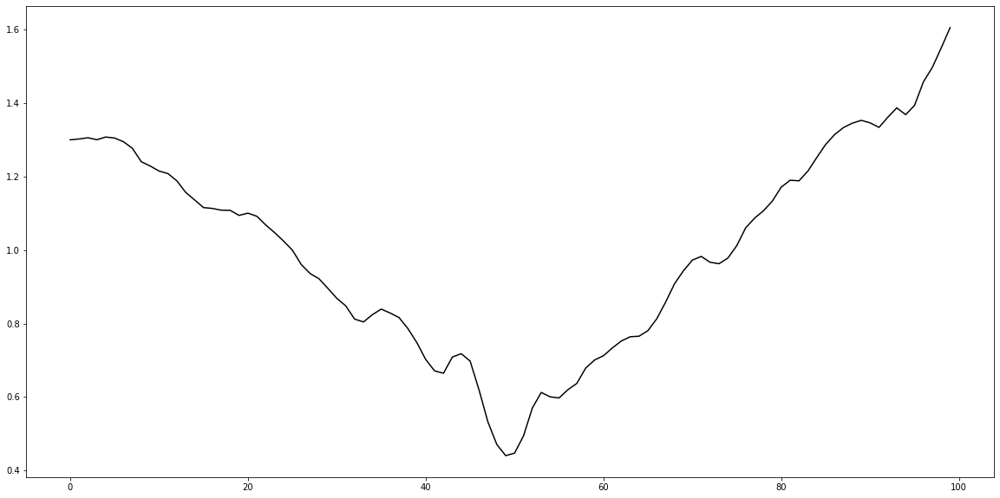

...

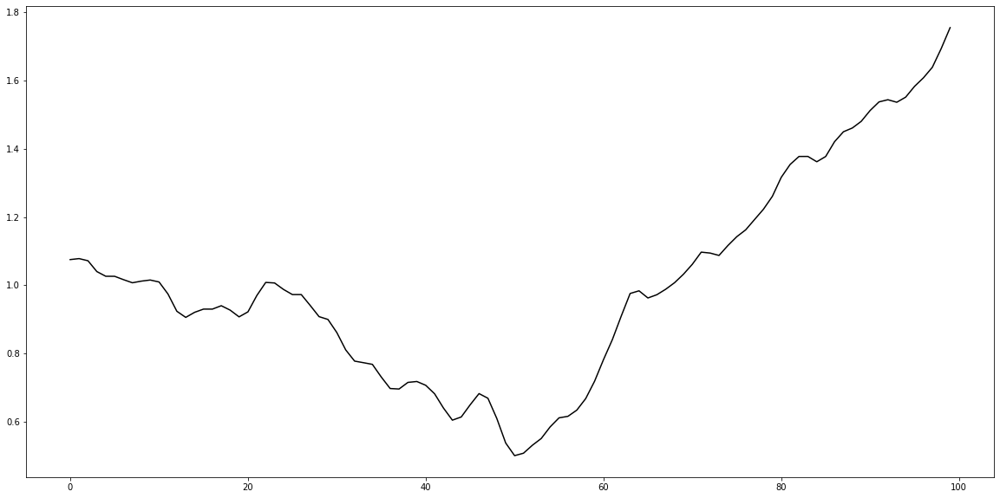

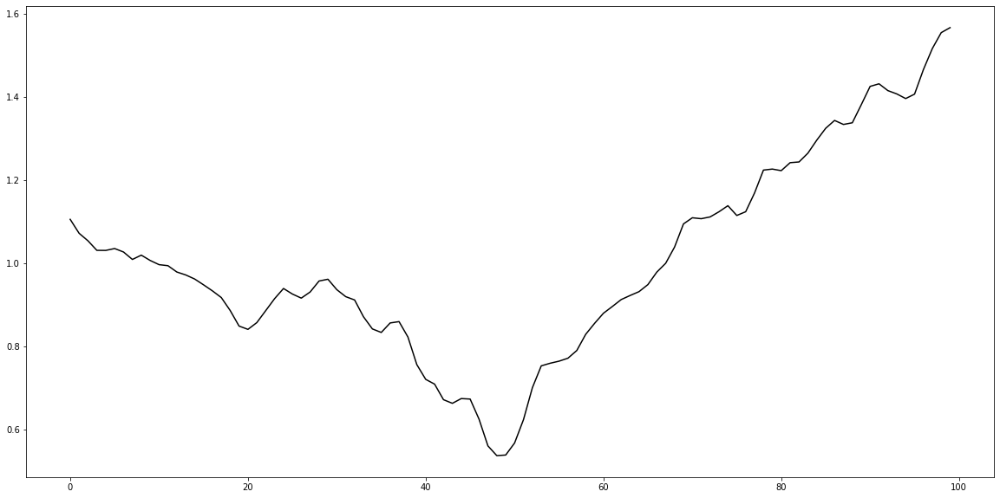

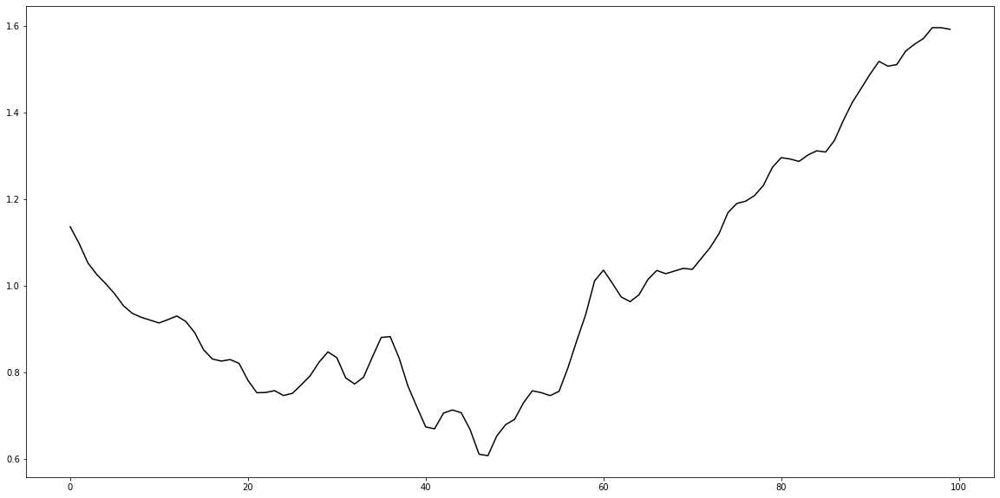

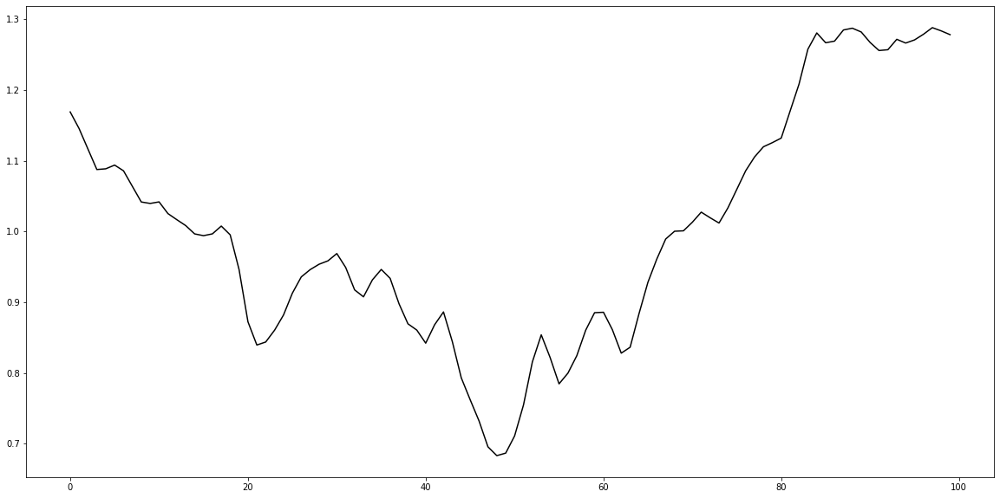

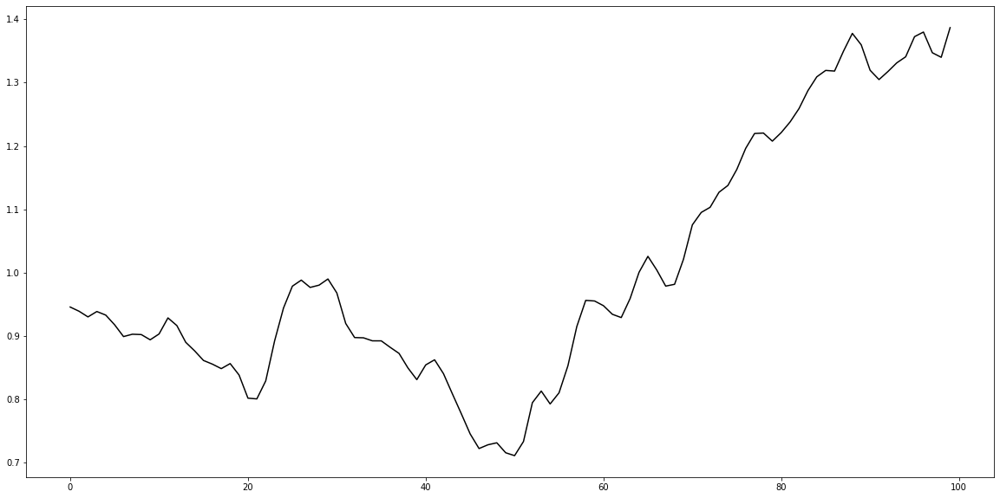

In [42]:
count = 0

for el in errors:
    plt.figure(figsize=(20,10))
    plt.plot(np.linspace(0,99,100), el, c='k')
    plt.show()

In [ ]:
from sklearn.metrics import mean_squared_error
def detShift(specArray, template):
    template = template/np.median(template)
    count = 0
    errorsArrGlobal = []
    for spec in specArray:
        errorsArr = []
        spec = spec/np.median(spec)
        for i in range(100):
            error = mean_squared_error(spec[150+i:350+i], template[200:400])
            errorsArr.append(error)
        errorsArr = errorsArr/np.mean(errorsArr)
        if count == 0:
            errorsArrGlobal = errorsArr
        else:
            errorsArrGlobal = np.vstack((errorsArrGlobal, errorsArr))
        count += 1
    return errorsArrGlobal

In [21]:
len(flxTemp)

1024

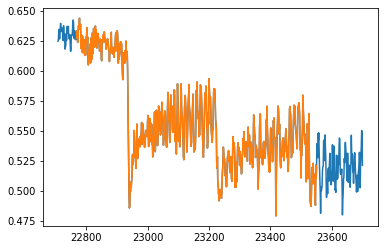

In [27]:

path = 'C:/Users/Admin/GD1400/shifted/Combined.fits'
wvlTemp, flxTemp = pyasl.read1dFitsSpec(path)
plt.plot(wvlTemp[100:-100],flxTemp[100:-100])
plt.plot(wvlTemp[150:800],flxTemp[150:800])

In [43]:
from sklearn.metrics import mean_squared_error
def detShiftL(specArray, template):
    template = template/np.median(template)
    count = 0
    errorsArrGlobal = []
    for spec in specArray:
        errorsArr = []
        spec = spec/np.median(spec)
        for i in range(100):
            error = mean_squared_error(spec[150+i:750+i], template[200:800])
            errorsArr.append(error)
        errorsArr = errorsArr/np.mean(errorsArr)
        if count == 0:
            errorsArrGlobal = errorsArr
        else:
            errorsArrGlobal = np.vstack((errorsArrGlobal, errorsArr))
        count += 1
    return errorsArrGlobal

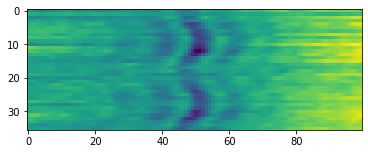

In [44]:
errors = detShiftL(oct29F, flxTemp)
plt.imshow(errors)


In [45]:
np.linspace(0,99,100)

array([ 0.,  1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.,  9., 10., 11., 12.,
       13., 14., 15., 16., 17., 18., 19., 20., 21., 22., 23., 24., 25.,
       26., 27., 28., 29., 30., 31., 32., 33., 34., 35., 36., 37., 38.,
       39., 40., 41., 42., 43., 44., 45., 46., 47., 48., 49., 50., 51.,
       52., 53., 54., 55., 56., 57., 58., 59., 60., 61., 62., 63., 64.,
       65., 66., 67., 68., 69., 70., 71., 72., 73., 74., 75., 76., 77.,
       78., 79., 80., 81., 82., 83., 84., 85., 86., 87., 88., 89., 90.,
       91., 92., 93., 94., 95., 96., 97., 98., 99.])

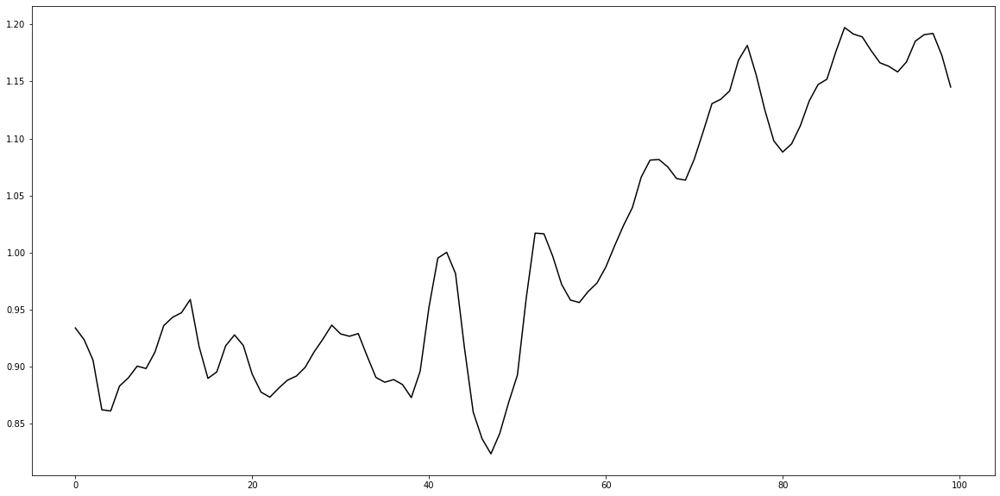

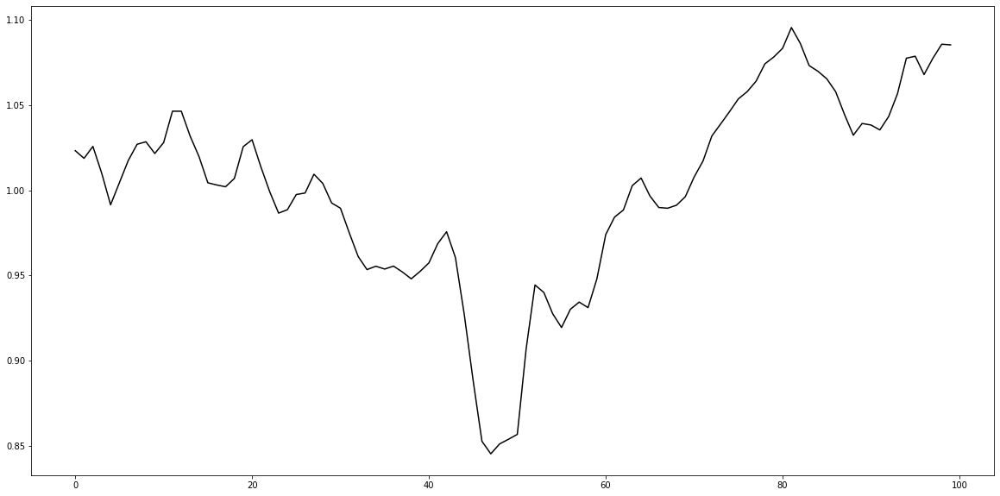

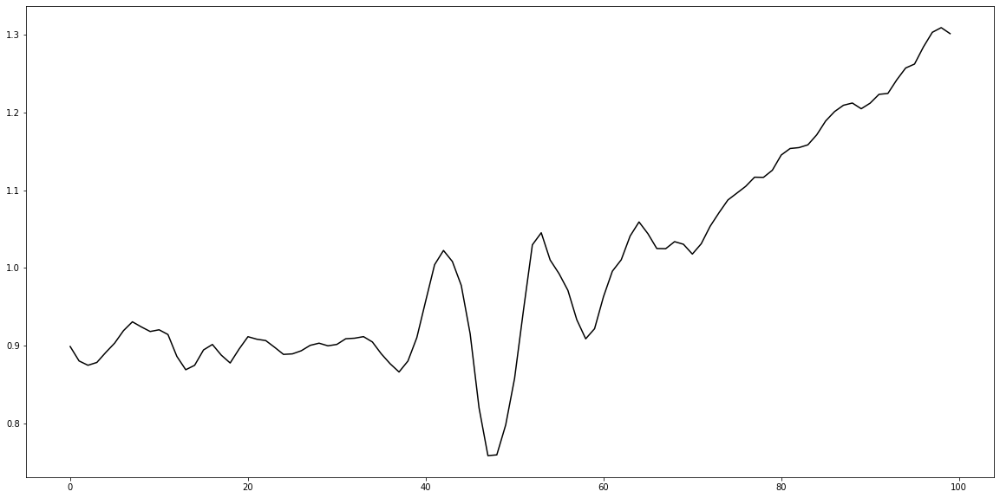

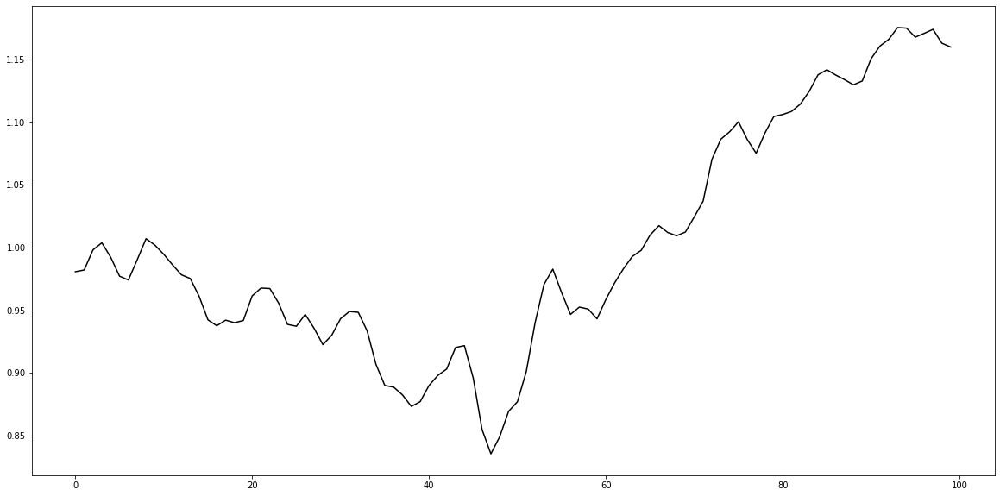

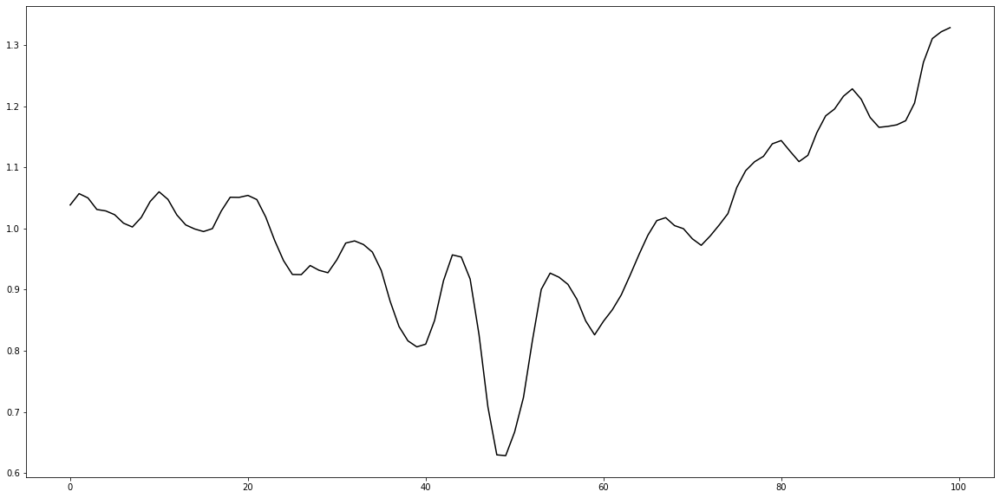

...

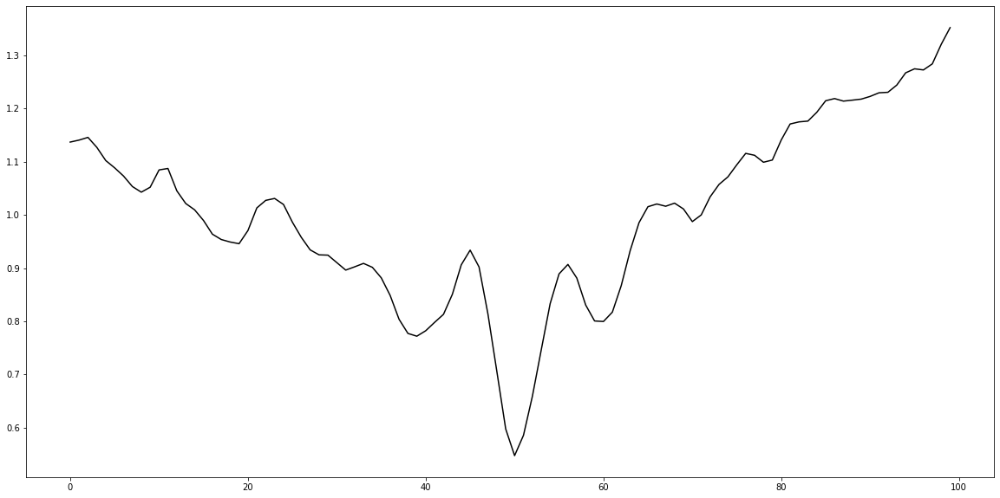

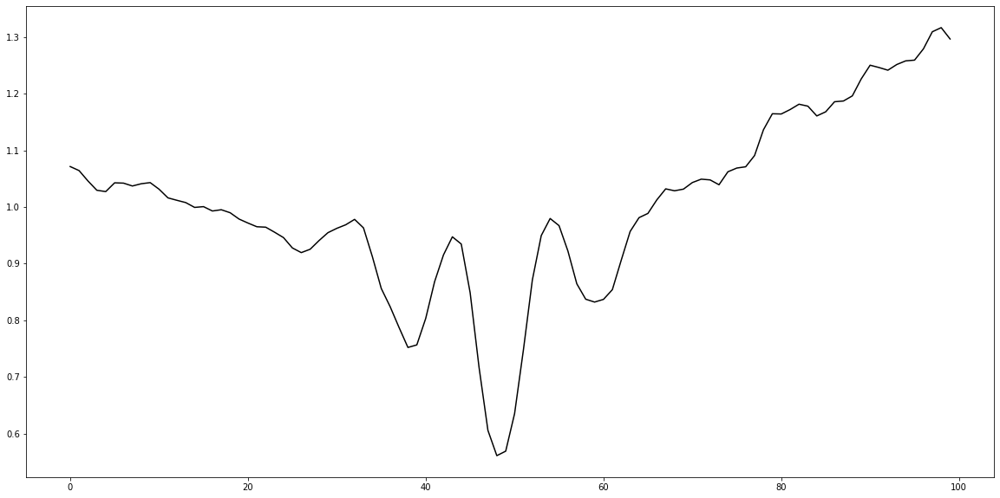

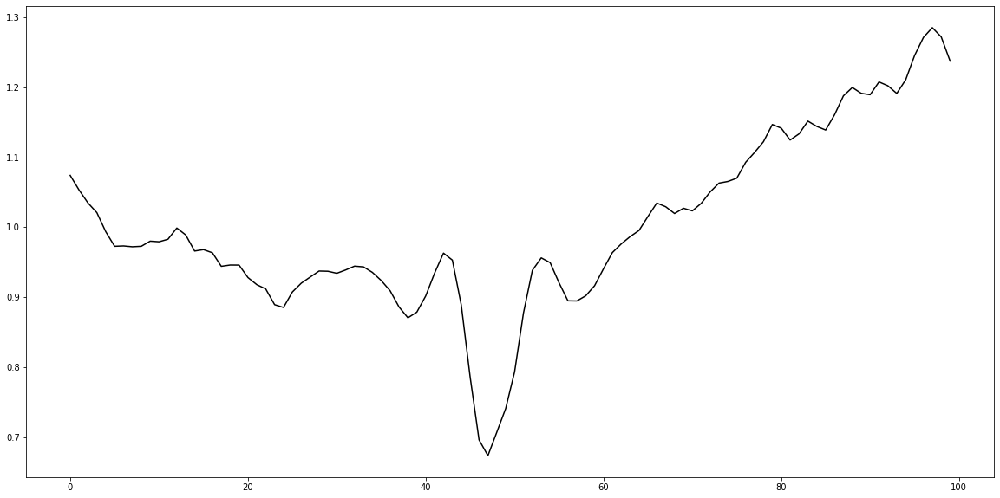

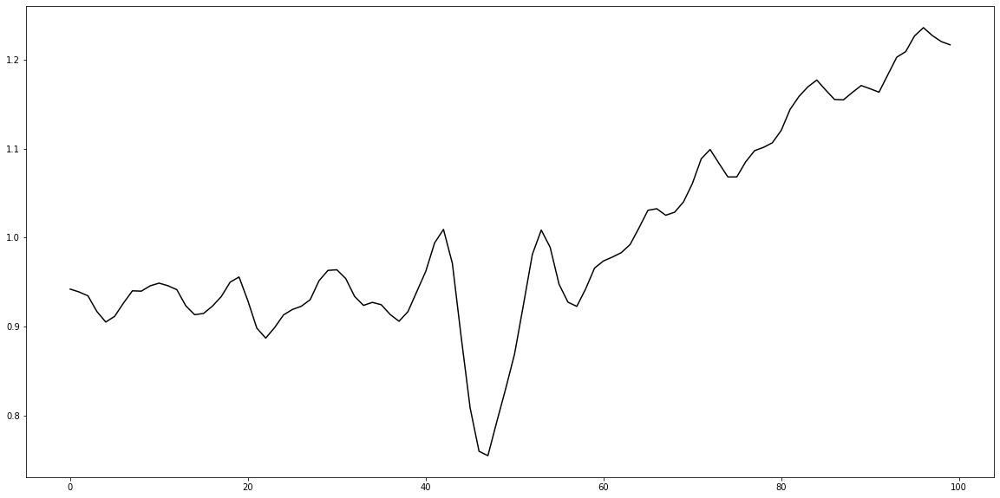

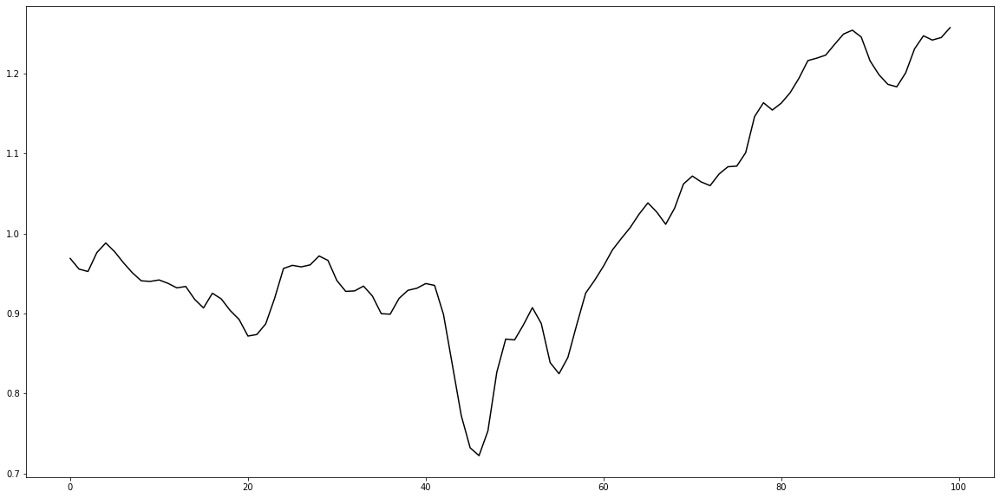

In [46]:
count = 0

for el in errors:
    plt.figure(figsize=(20,10))
    plt.plot(np.linspace(0,99,100), el, c='k')
    plt.show()

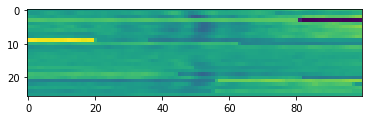

In [47]:
errors = detShiftL(oct28F, flxTemp)
plt.imshow(errors)


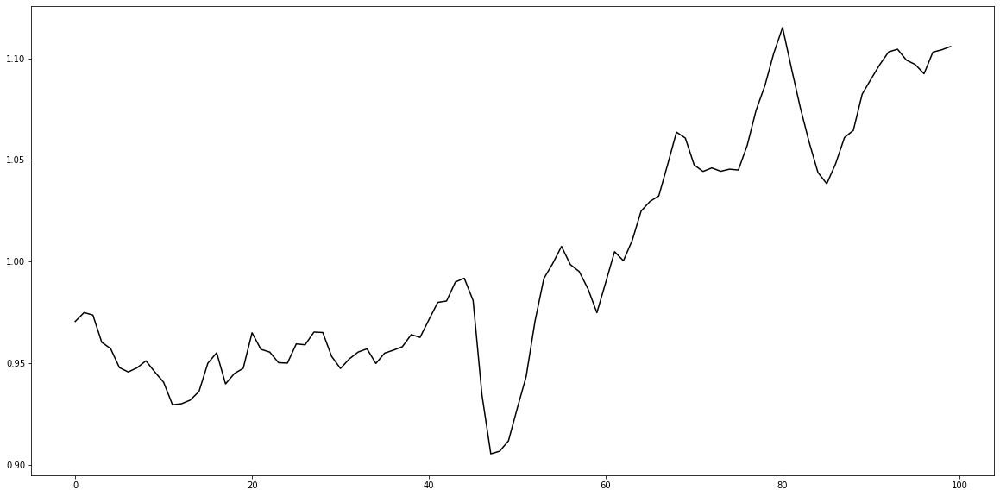

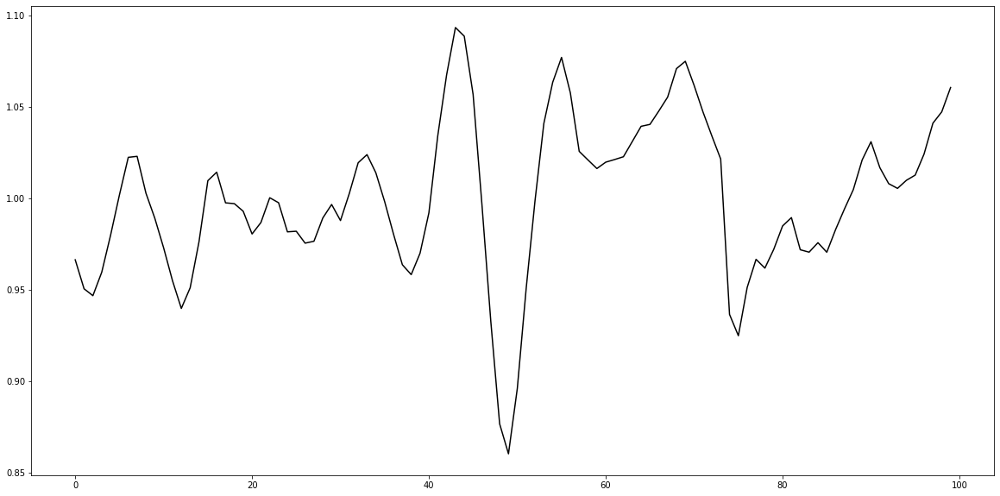

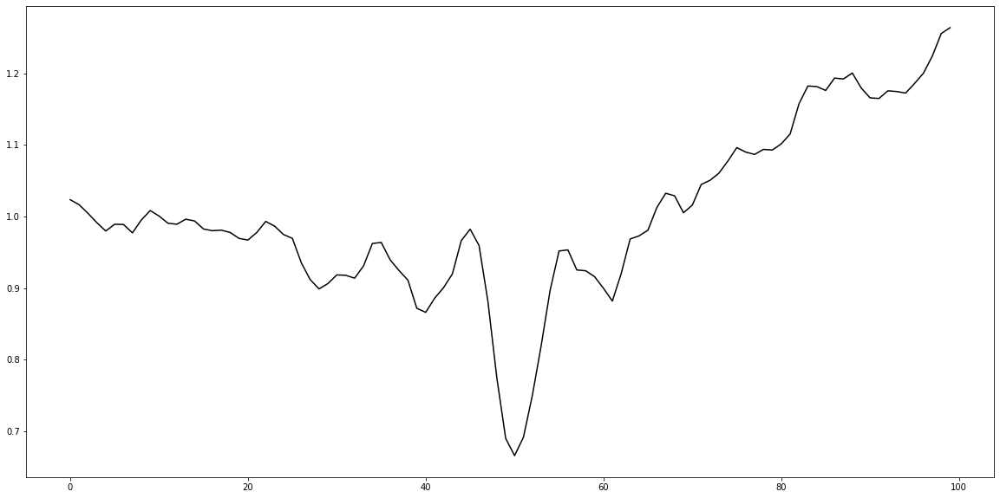

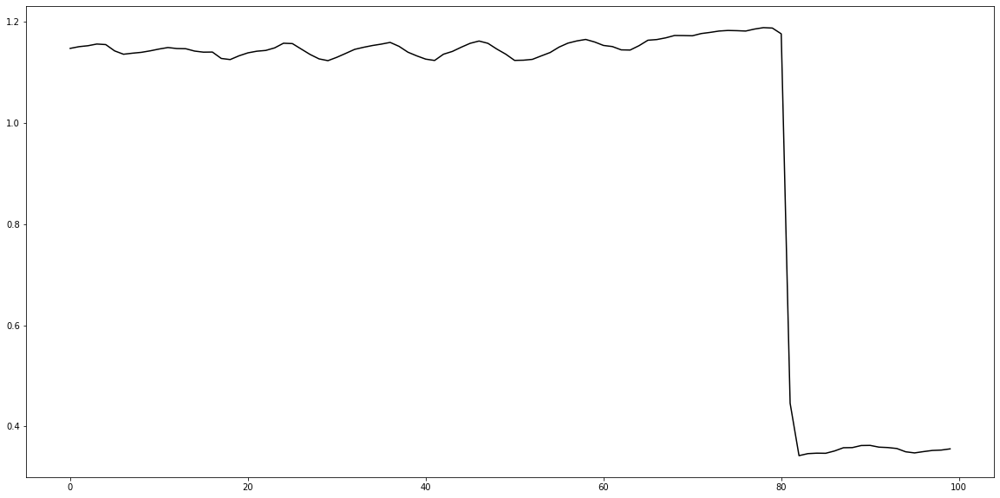

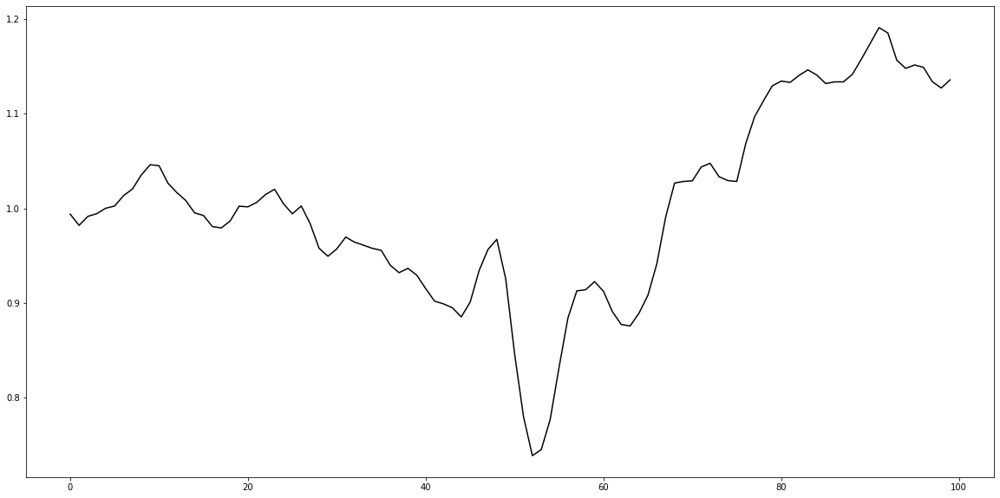

...

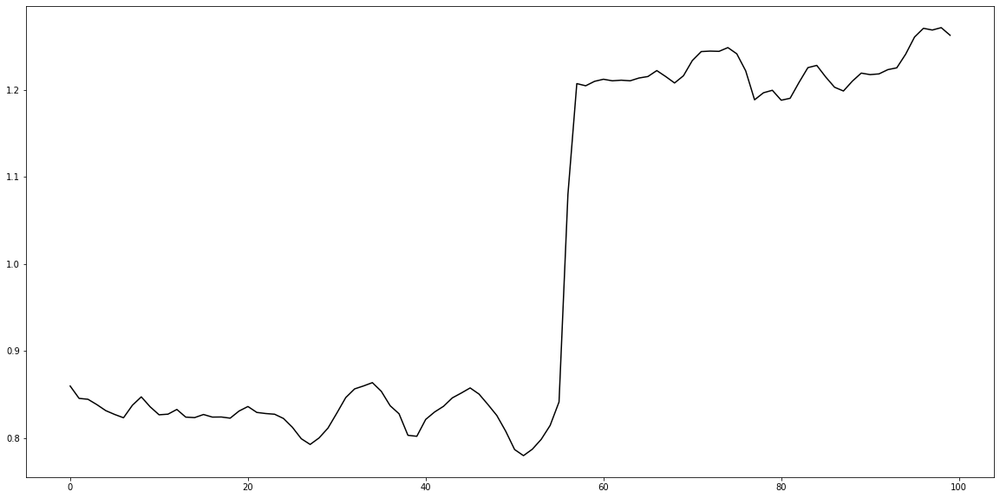

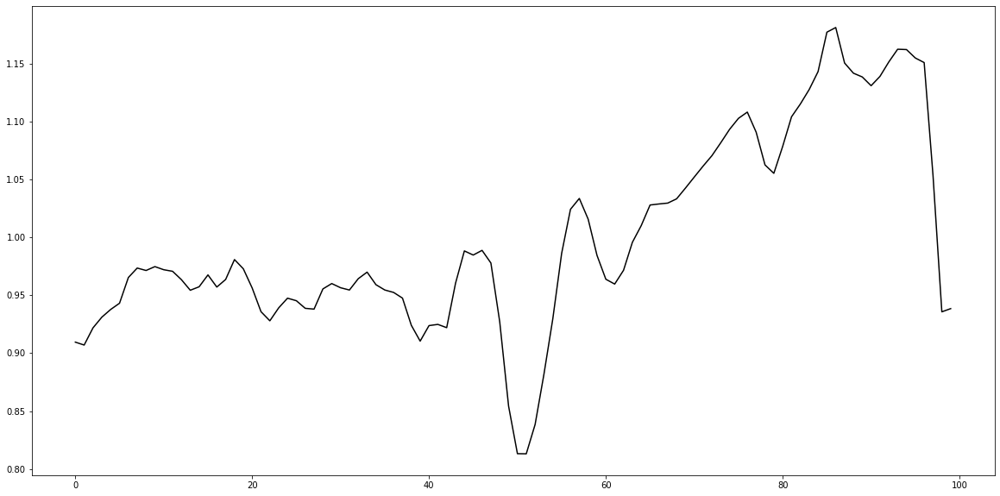

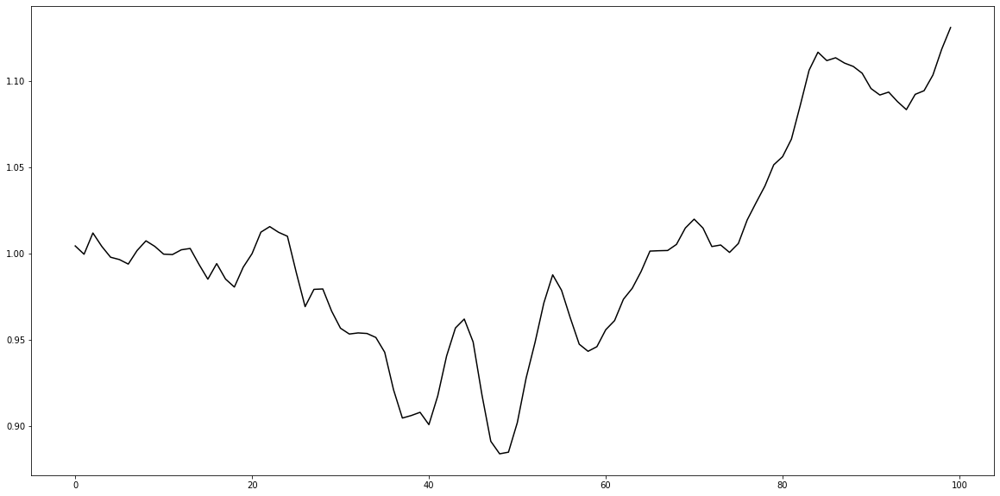

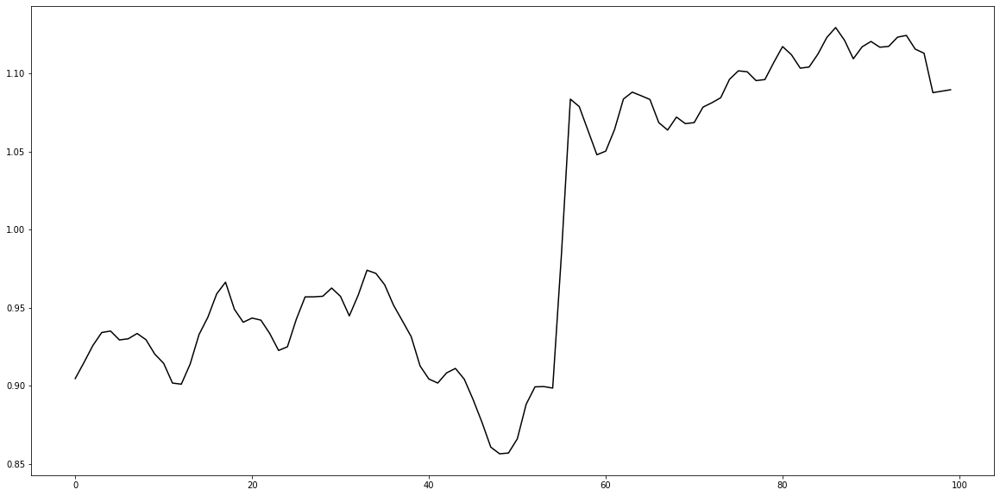

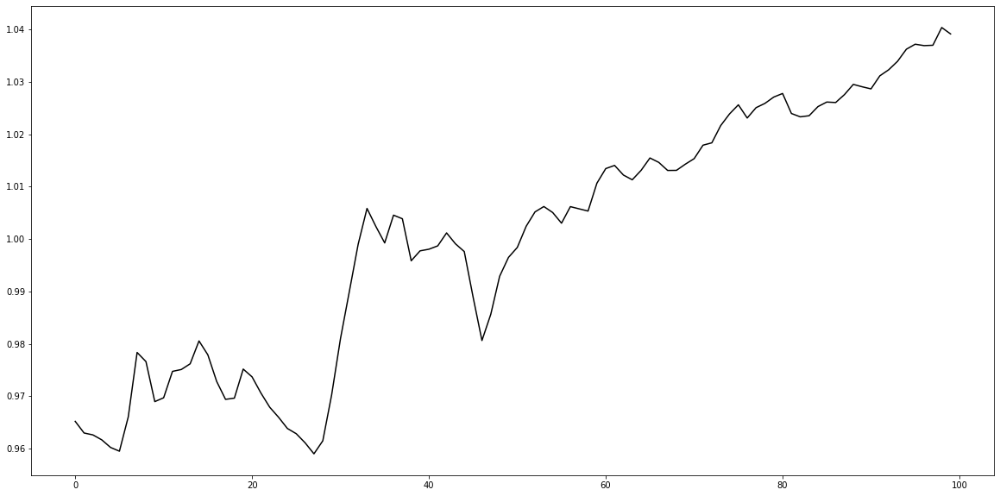

In [48]:
count = 0

for el in errors:
    plt.figure(figsize=(20,10))
    plt.plot(np.linspace(0,99,100), el, c='k')
    plt.show()

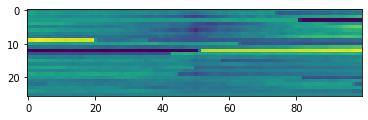

In [12]:
errors = detShift(oct28F, flxTemp28)
plt.imshow(errors)

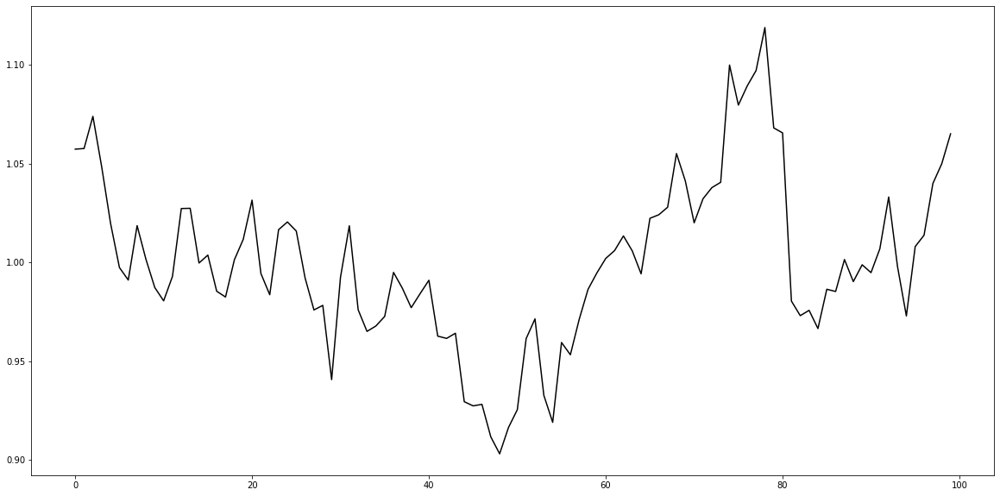

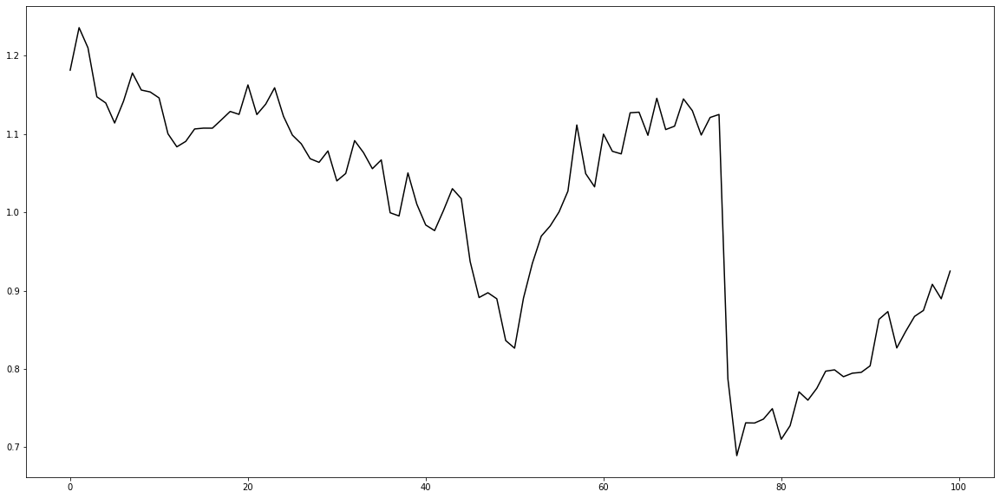

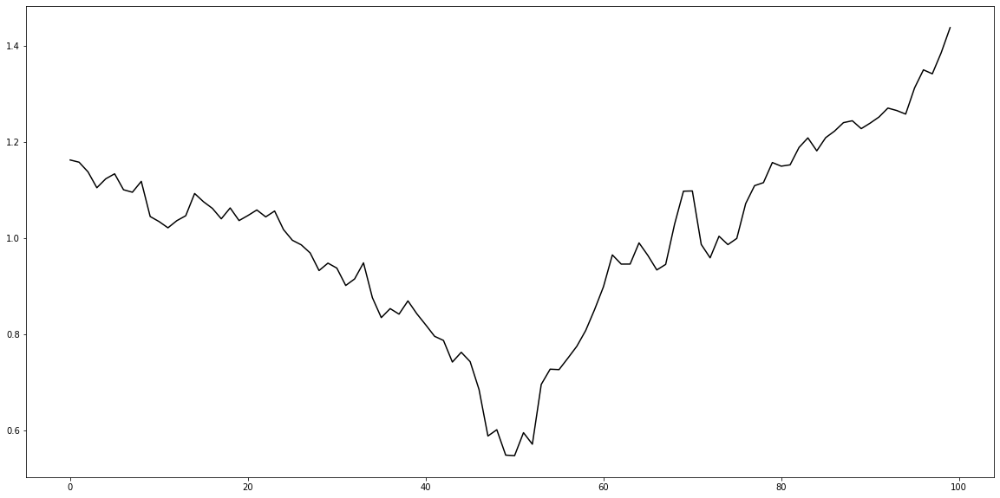

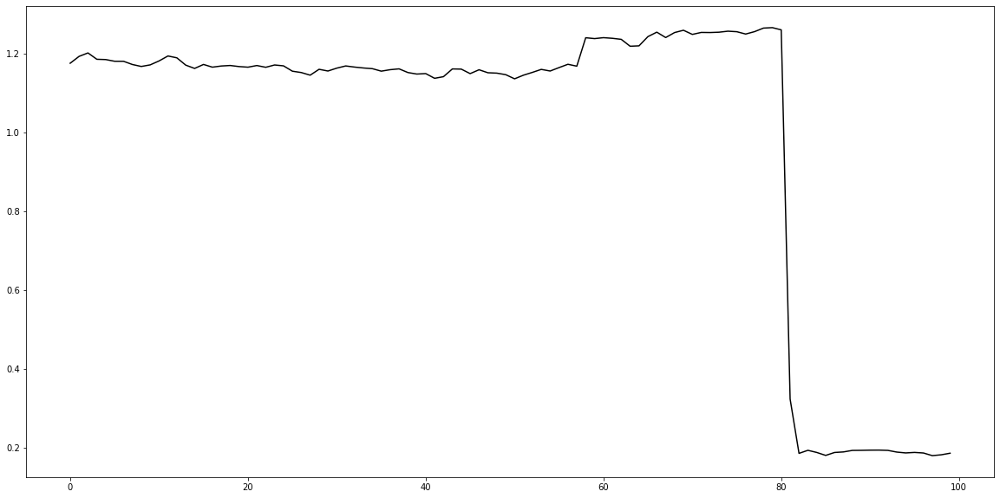

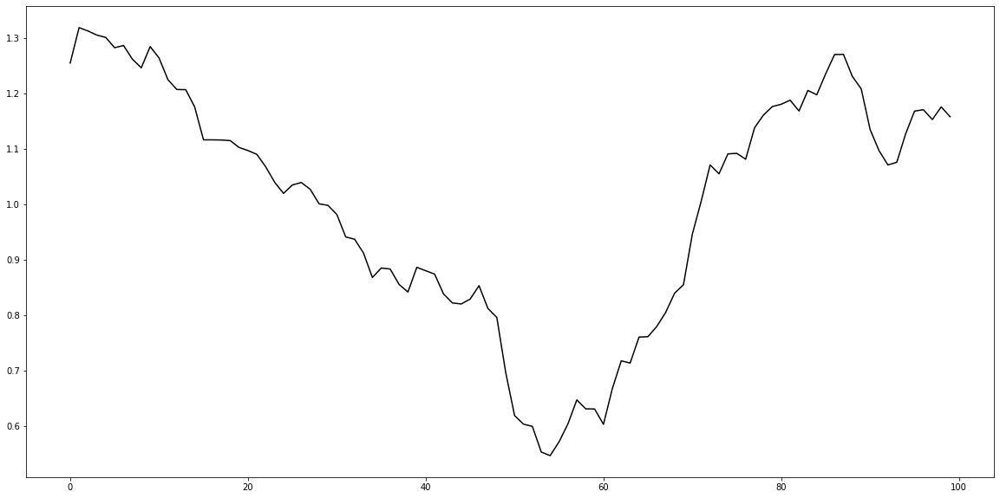

...

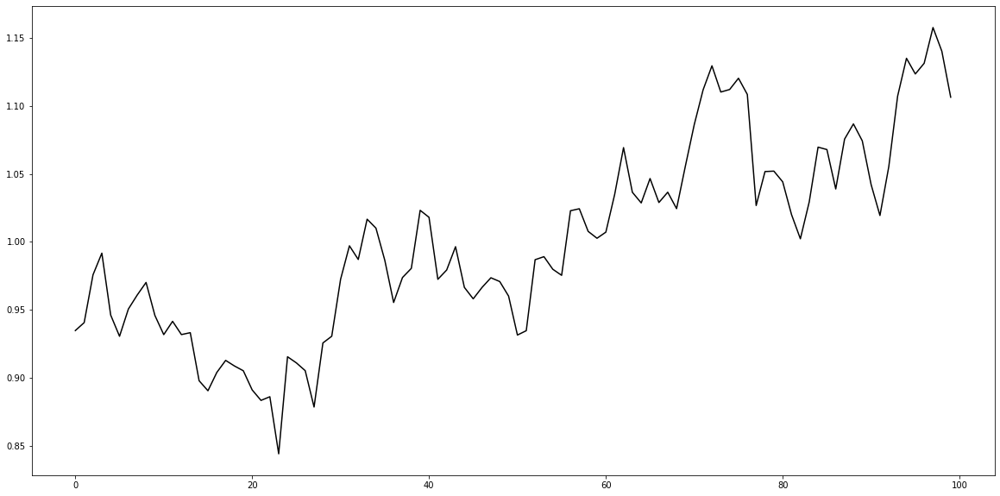

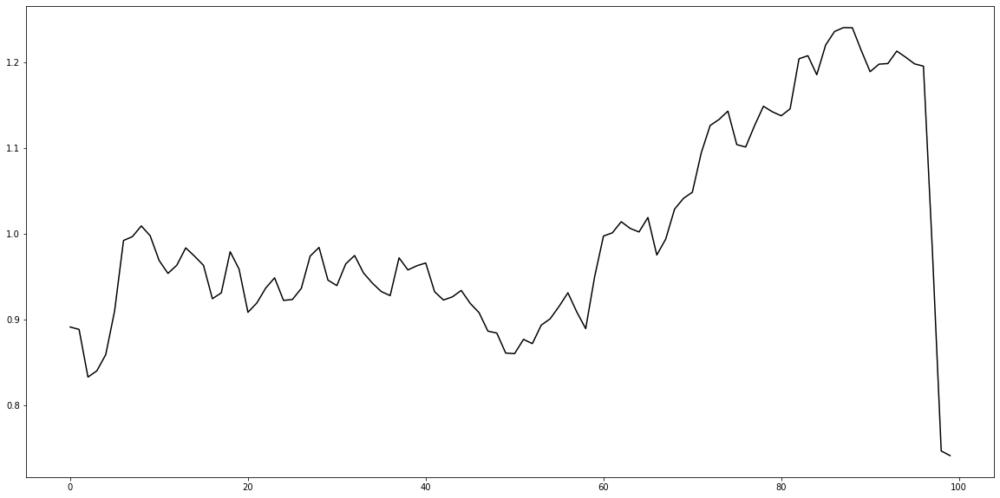

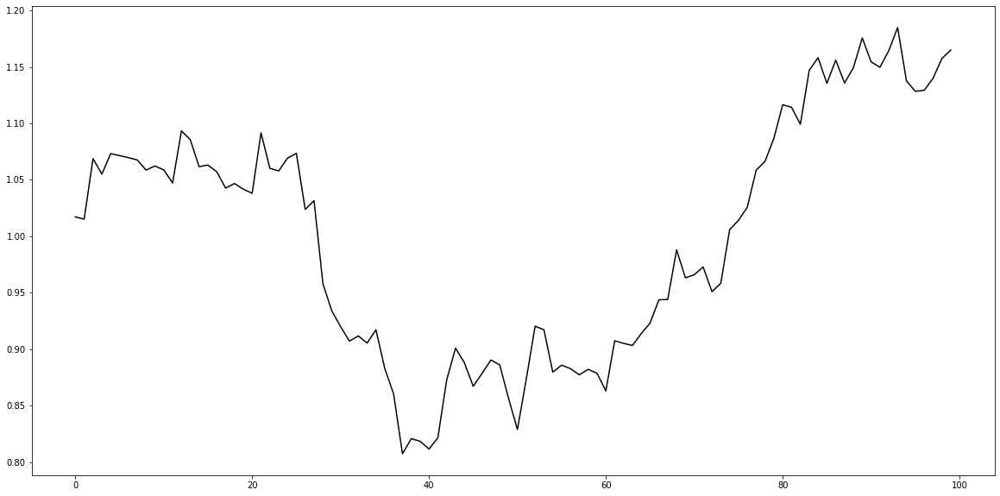

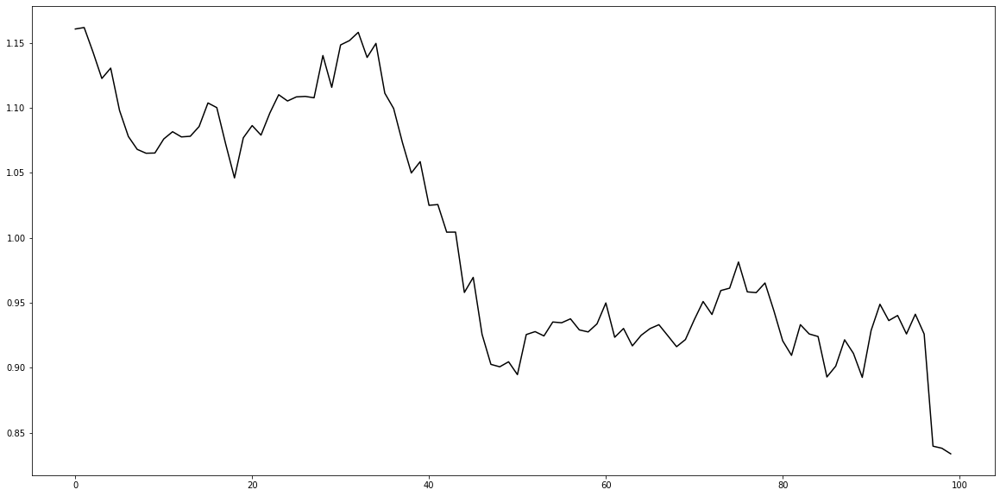

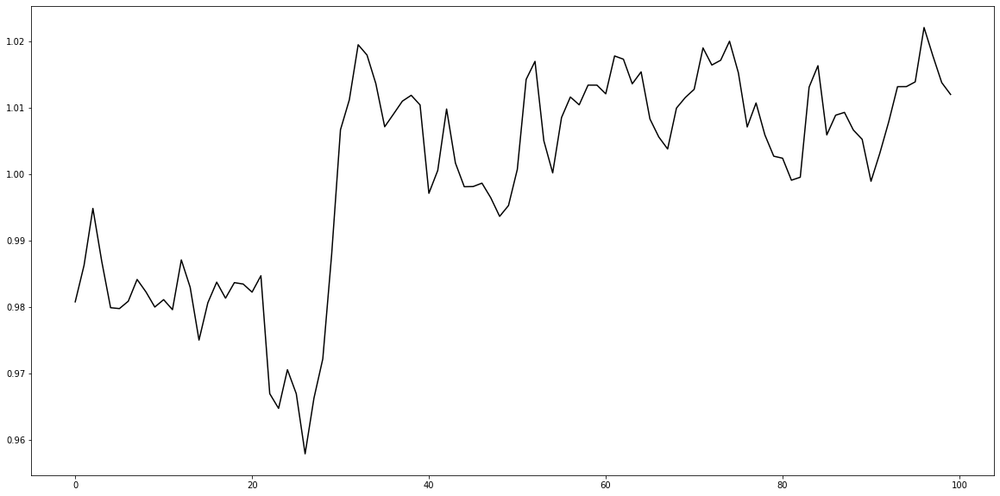

In [13]:
count = 0

for el in errors:
    plt.figure(figsize=(20,10))
    plt.plot(np.linspace(0,99,100), el, c='k')
    plt.show()

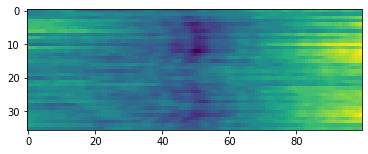

In [14]:
errors = detShift(oct29F, flxTemp29)
plt.imshow(errors)

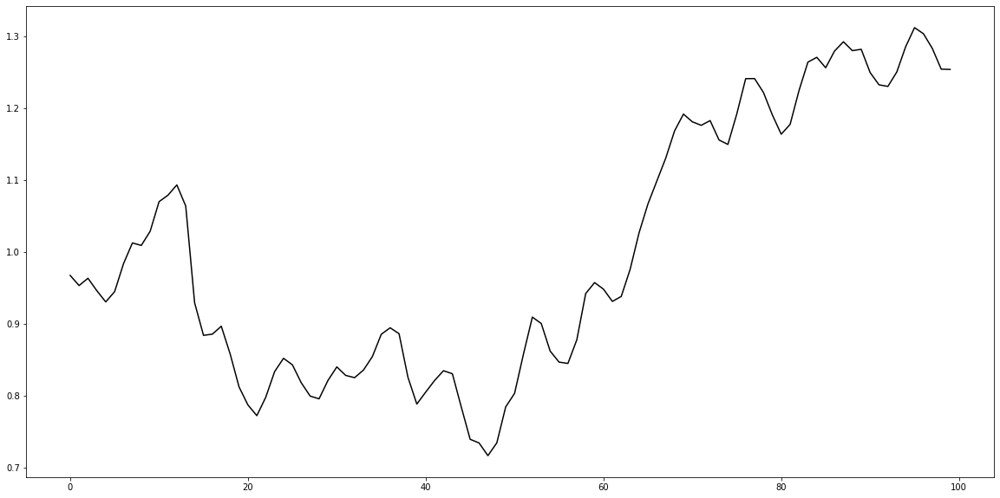

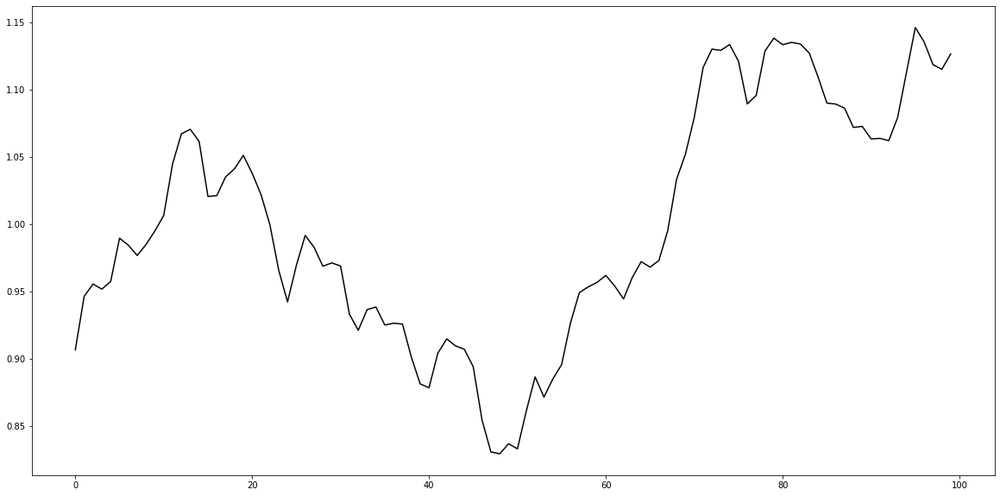

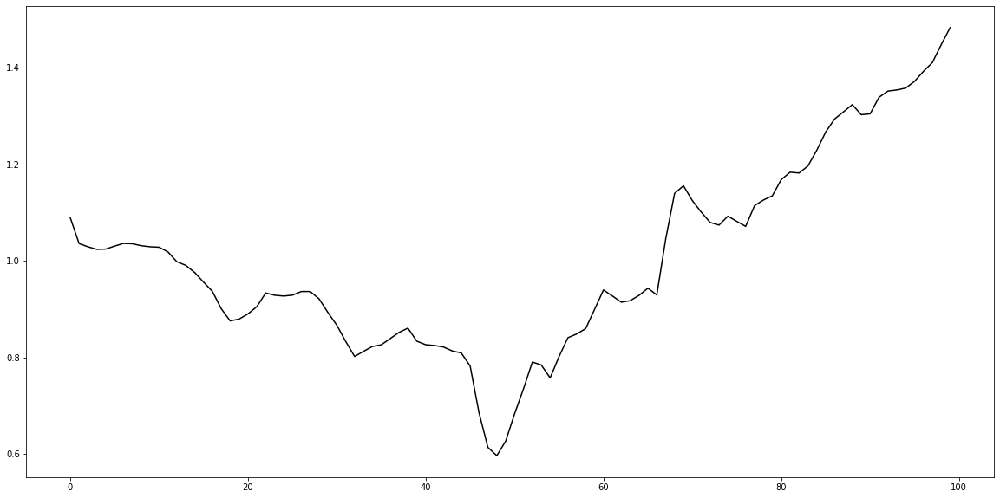

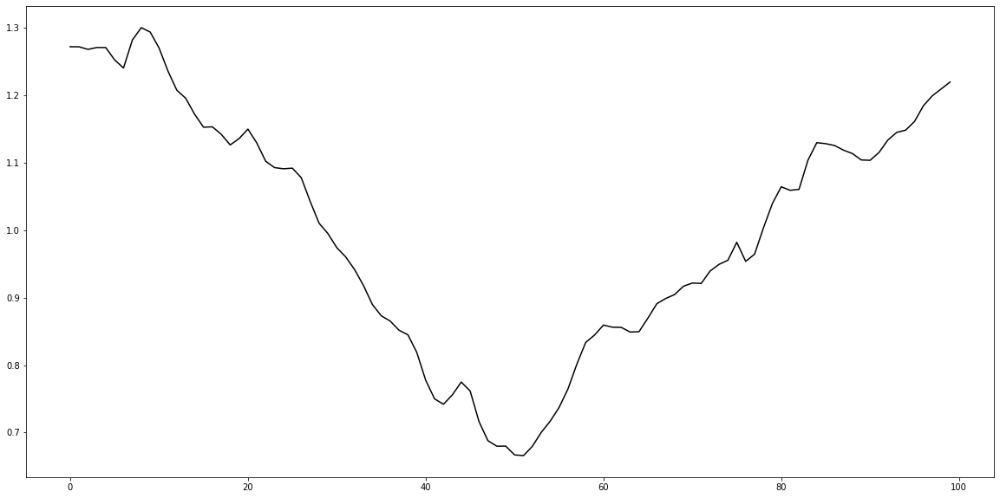

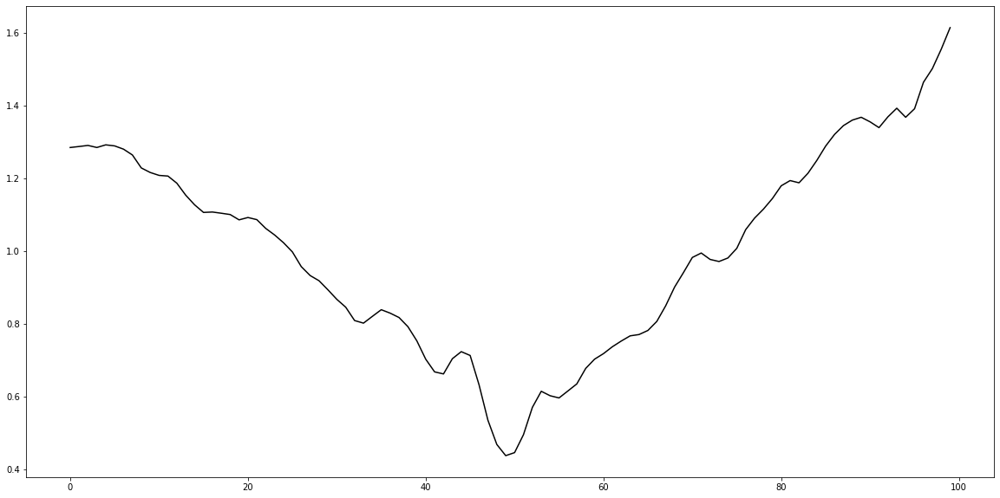

...

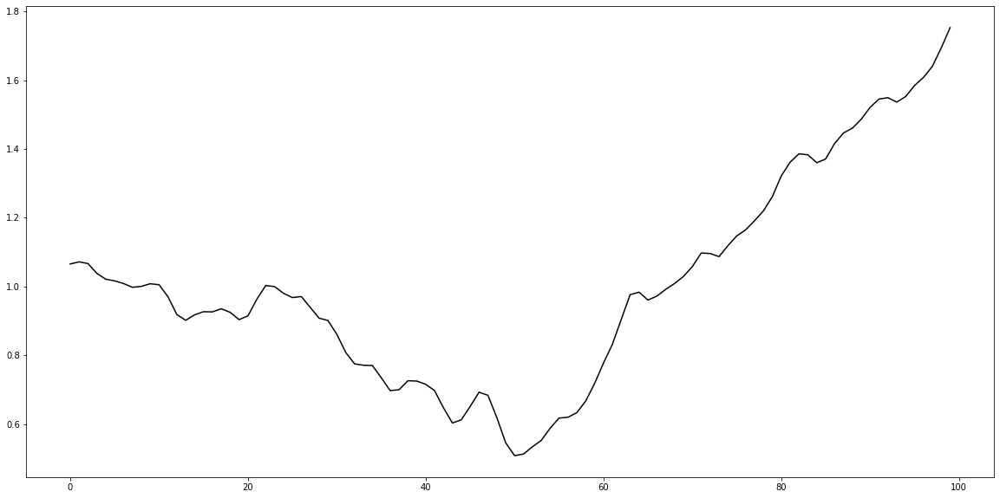

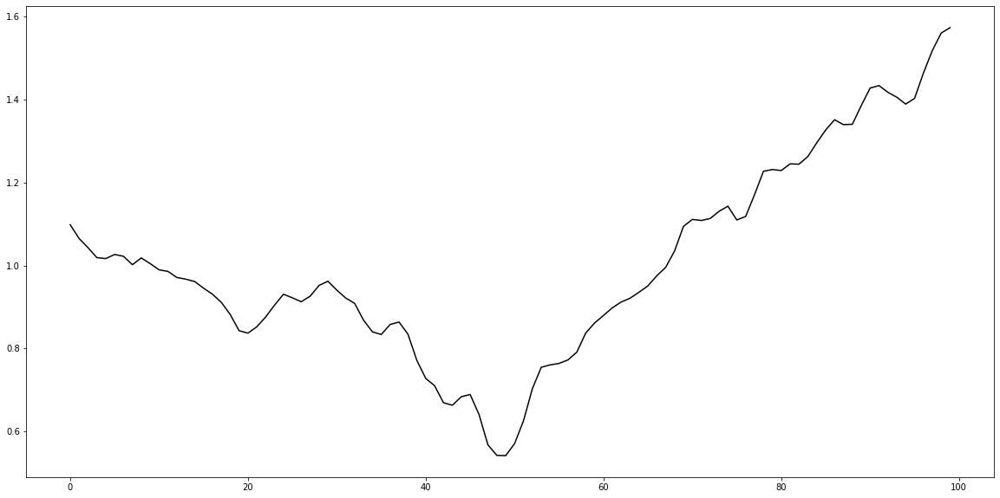

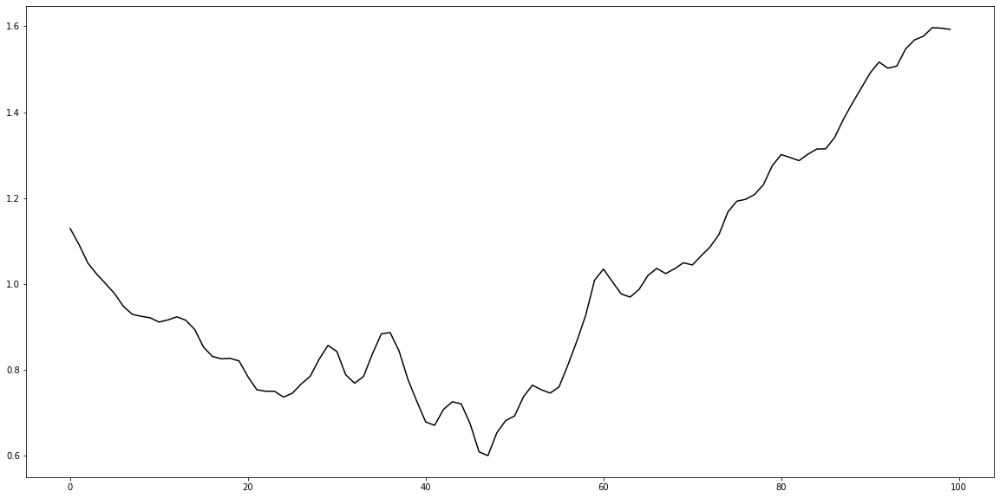

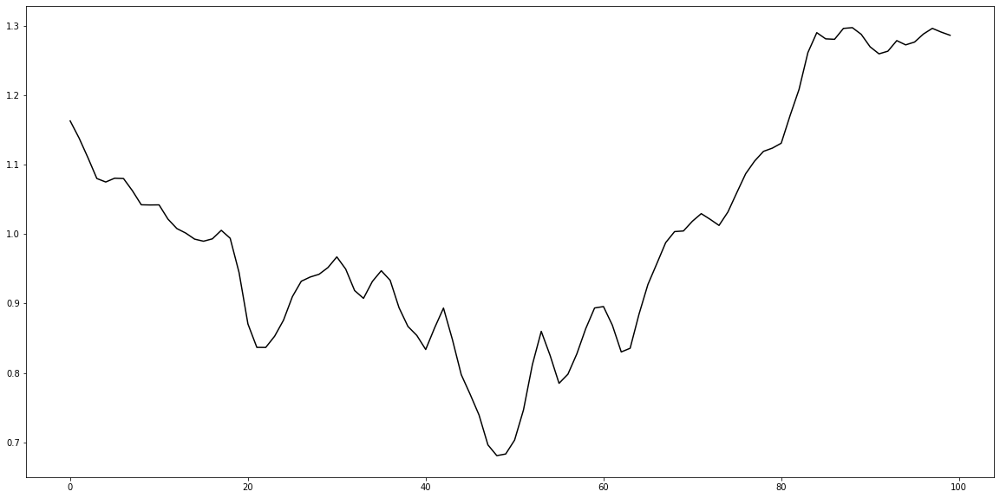

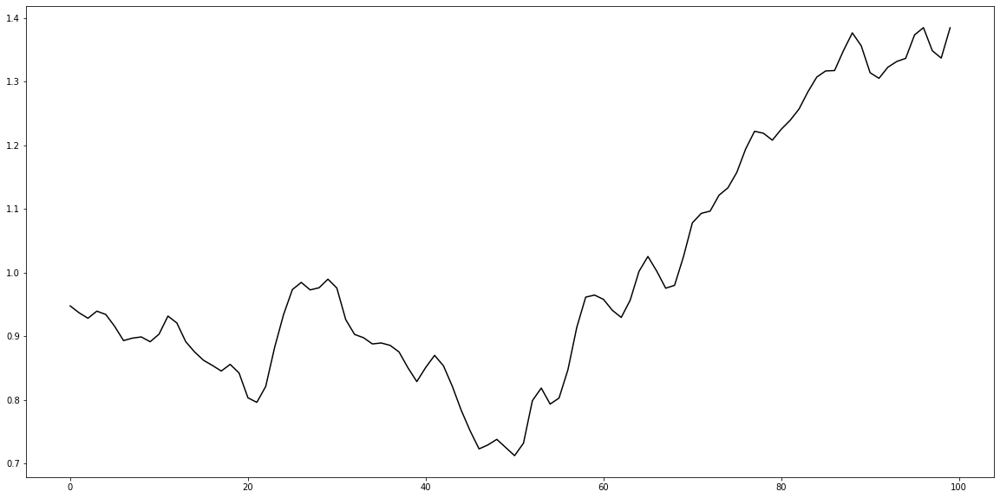

In [15]:
count = 0

for el in errors:
    plt.figure(figsize=(20,10))
    plt.plot(np.linspace(0,99,100), el, c='k')
    plt.show()